### **Importar Bibliotecas**

In [1]:
import math
import os
import time
import heapq
from datetime import datetime, date, time as dtime
from datetime import timedelta
import pandas as pd
import numpy as np
import contextily as ctx
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image, display
from matplotlib.collections import LineCollection
from matplotlib.animation import FuncAnimation
from matplotlib.animation import FFMpegWriter
import matplotlib.ticker as mticker
from IPython.display import HTML
from itertools import combinations
from typing import Dict, List, Tuple, Set
from shapely.geometry import shape
import osmnx as ox
import networkx as nx
from scipy.spatial import cKDTree
import heapq
import pickle
from tqdm import tqdm
import pymoo
import itertools
import geopandas as gpd
from shapely.geometry import LineString, Point
from pymoo.core.problem import ElementwiseProblem
from pymoo.core.sampling import Sampling
from pymoo.core.mutation import Mutation
from pymoo.core.crossover import Crossover
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.algorithms.moo.nsga3 import NSGA3
from pymoo.optimize import minimize
from pymoo.operators.crossover.ox import OrderCrossover
from pymoo.operators.mutation.inversion import InversionMutation
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.core.duplicate import ElementwiseDuplicateElimination
from pymoo.algorithms.moo.moead import MOEAD
from pymoo.util.ref_dirs import get_reference_directions

### **Constantes Globais**

In [2]:
# Fatores de emissão de CO2 em gramas por metro
EMISSION_FACTORS = {
    'transit': 0.04, 
    'bus': 0.1099,
    'walk': 0.0
}
# Velocidade média em metros por segundo
AVERAGE_SPEED_WALK = 1.4 

# Tipo de rota
ROUTE_TYPE = {
    0: 'metro',
    1: 'bus', 
    2: 'walk'
}

### **Carregamento de Dados**

In [3]:
# Carregamento dos dados (bus)
agency_bus = pd.read_csv(r'bus\agency.txt', sep=',') 
calendar_dates_bus = pd.read_csv(r'bus\calendar_dates.txt', sep=',')
calendar_bus = pd.read_csv(r'bus\calendar.txt', sep=',')
routes_bus = pd.read_csv(r'bus\routes.txt', sep=',')
shapes_bus = pd.read_csv(r'bus\shapes.txt', sep=',')
stop_times_bus = pd.read_csv(r'bus\stop_times.txt', sep=',')
stops_bus = pd.read_csv(r'bus\stops.txt', sep=',')
trips_bus = pd.read_csv(r'bus\trips.txt', sep=',')
transfers_bus = pd.read_csv(r'bus\transfers.txt', sep=',')

In [4]:
# Carregamento dos dados (transit)
agency_transit = pd.read_csv(r'transit\agency.txt', sep=',')
calendar_dates_transit = pd.read_csv(r'transit\calendar_dates.txt', sep=',')
calendar_transit = pd.read_csv(r'transit\calendar.txt', sep=',')
fare_attributes = pd.read_csv(r'transit\fare_attributes.txt', sep=',')
fare_rules = pd.read_csv(r'transit\fare_rules.txt', sep=',')
routes_transit = pd.read_csv(r'transit\routes.txt', sep=',')
shapes_transit = pd.read_csv(r'transit\shapes.txt', sep=',')
stop_times_transit = pd.read_csv(r'transit\stop_times.txt', sep=',')
stops_transit = pd.read_csv(r'transit\stops.txt', sep=',')
trips_transit = pd.read_csv(r'transit\trips.txt', sep=',')
transfers_transit = pd.read_csv(r'transit\transfers.txt', sep=',')

### **Visualização dos Dados**

#### Bus

In [5]:
agency_bus # Dados da agência de autocarros

,agency_id,agency_name,agency_url,agency_timezone,agency_lang
0,STCP,Sociedade Transportes Colectivos do Porto,http://www.stcp.pt,Europe/Lisbon,pt


In [6]:
calendar_bus # Dados do calendário de autocarros

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,UTEIS,1,1,1,1,1,0,0,20250422,20251231
1,SAB,0,0,0,0,0,1,0,20250422,20251231
2,DOM,0,0,0,0,0,0,1,20250422,20251231
3,UTEISFE,1,1,1,1,1,0,0,20250411,20250421
4,SABFE,0,0,0,0,0,1,0,20250411,20250421
5,DOMFE,0,0,0,0,0,0,1,20250411,20250421
6,ELECUTEIS,1,1,1,1,1,0,0,20221226,20251231
7,ELECSAB,0,0,0,0,0,1,0,20221226,20251231
8,ELECDOM,0,0,0,0,0,0,1,20221226,20251231


In [7]:
calendar_dates_bus # Dados das exeções de calendário

,service_id,date,exception_type
0,UTEISFE,20250418,2
1,SABFE,20250418,1
2,UTEIS,20250425,2
3,DOM,20250425,1
4,UTEIS,20250501,2
5,DOM,20250501,1
6,UTEIS,20250610,2
7,DOM,20250610,1


In [8]:
routes_bus = routes_bus.drop(columns=['route_desc', 'route_url'])
routes_bus # Dados das linhas de autocarros

,route_id,route_short_name,route_long_name,route_type,route_color,route_text_color
0,200,200,Bolhão - Cast. Queijo,3,187EC2,FFFFFF
1,201,201,Aliados - Viso,3,187EC2,FFFFFF
2,203,203,Marquês - Cast.Queijo,3,187EC2,FFFFFF
3,204,204,Hospital De S.João - Foz,3,187EC2,FFFFFF
4,205,205,Campanhã - Castelo Do Queijo,3,187EC2,FFFFFF
...,...,...,...,...,...,...
68,11M,11M,Hosp. S. João - Coimbrões,3,000000,FFFFFF
69,12M,12M,Av.Aliados - Sto.Ovídio,3,000000,FFFFFF
70,13M,13M,Av.Aliados - Matosinhos (Mercado),3,000000,FFFFFF
71,202,202,Aliados - Passeio Alegre (via Av. Bessa),3,187EC2,FFFFFF


In [9]:
shapes_bus # Dados das formas das rotas de autocarros

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence
0,1_0_1_shp,41.140801,-8.615485,1
1,1_0_1_shp,41.140652,-8.615913,2
2,1_0_1_shp,41.140588,-8.616105,3
3,1_0_1_shp,41.140568,-8.616204,4
4,1_0_1_shp,41.140558,-8.616319,5
...,...,...,...,...
39030,9M_1_1_shp,41.147556,-8.609425,237
39031,9M_1_1_shp,41.147843,-8.610942,238
39032,9M_1_1_shp,41.147888,-8.611286,239
39033,9M_1_1_shp,41.147848,-8.611296,240


In [10]:
stops_bus = stops_bus.drop(columns=['stop_url', 'zone_id', 'stop_code'])
stops_bus # Dados das paragens de autocarros

,stop_id,stop_name,stop_lat,stop_lon
0,CRG2,CORGA,41.209880,-8.575228
1,FMGO3,FORMIGUEIRO,41.205222,-8.586722
2,MRT2,MIRANTE,41.213370,-8.563202
3,FMGO4,FORMIGUEIRO,41.205350,-8.586645
4,PCUA1,PÍCUA,41.204598,-8.569305
...,...,...,...,...
2497,TLHR1,TELHEIRA,41.178266,-8.613936
2498,AVC1,AVAL CIMA,41.168423,-8.603409
2499,DAH2,D.AFONSO HENRIQUES,41.172398,-8.681619
2500,FCH1,FUNCHAL,41.163126,-8.683408


In [11]:
stop_times_bus = stop_times_bus.drop(columns=['stop_headsign'])
stop_times_bus # Dados dos horários das paragens de autocarros

,trip_id,arrival_time,departure_time,stop_id,stop_sequence
0,107_1_D_1,6:40:00,6:40:00,AREI2,1
1,107_1_D_1,6:40:32,6:40:32,JD4,2
2,107_1_D_1,6:41:27,6:41:27,PNG4,3
3,107_1_D_1,6:42:22,6:42:22,TVA2,4
4,107_1_D_1,6:43:15,6:43:15,AZV,5
...,...,...,...,...,...
901084,9M_1_U_11,5:53:58,5:53:58,DQL1,37
901085,9M_1_U_11,5:54:55,5:54:55,ALXH3,38
901086,9M_1_U_11,5:55:35,5:55:35,BTLH1,39
901087,9M_1_U_11,5:57:07,5:57:07,PRDJ,40


In [12]:
trips_bus = trips_bus.drop(columns=['wheelchair_accessible', 'block_id'])
trips_bus # Dados das viagens de autocarros (relação dos identificadores)

,route_id,direction_id,service_id,trip_id,trip_headsign,shape_id
0,107,0,UTEIS,107_0_U_29,Areias,107_0_1_shp
1,107,1,UTEIS,107_1_U_30,Estádio do Dragão,107_1_1_shp
2,107,0,UTEIS,107_0_U_31,Areias,107_0_1_shp
3,107,1,UTEIS,107_1_U_32,Estádio do Dragão,107_1_1_shp
4,107,0,UTEIS,107_0_U_33,Areias,107_0_1_shp
...,...,...,...,...,...,...
25176,9M,1,DOM,9M_1_D_7,Av. Aliados,9M_1_1_shp
25177,9M,0,DOM,9M_0_D_8,Gondomar (via TIC),9M_0_1_shp
25178,9M,1,DOM,9M_1_D_9,Av. Aliados,9M_1_1_shp
25179,9M,0,DOM,9M_0_D_10,Gondomar (via TIC),9M_0_1_shp


In [13]:
transfers_bus # Dados das transferências de autocarros

,from_stop_id,to_stop_id,transfer_type
0,PARR2,CHAS3,3
1,ALFG1,FTN2,3
2,INF1,FTN2,3
3,ALFG5,FTN2,3
4,RBRI1,FTN2,3
...,...,...,...
477,AAL2,AAL4,1
478,AL7,AAL2,1
479,AAL4,AAL2,1
480,AAL1,AAL2,1


#### Transit

In [14]:
agency_transit # Dados do Metro do Porto

,agency_id,agency_name,agency_url,agency_timezone,agency_lang
0,NaN,Metro do Porto,https://www.metrodoporto.pt,Europe/Lisbon,pt


In [15]:
calendar_dates_transit # Dados das datas do calendário do Metro

,service_id,date,exception_type
0,ADF,20251005,1
1,AS,20251005,2
2,AU,20251005,2
3,BDF,20251005,1
4,BexDF,20251005,1
...,...,...,...
286,EU,20260604,2
287,FDF,20260604,1
288,FS,20260604,2
289,FU,20260604,2


In [16]:
calendar_transit # Dados do calendário do Metro

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,BDF,0,0,0,0,0,0,1,20250908,20260801
1,CDF,0,0,0,0,0,0,1,20250908,20260801
2,DDF,0,0,0,0,0,0,1,20250908,20260801
3,FDF,0,0,0,0,0,0,1,20250908,20260801
4,EDF,0,0,0,0,0,0,1,20250908,20260801
5,ADF,0,0,0,0,0,0,1,20250908,20260801
6,BS,0,0,0,0,0,1,0,20250908,20260801
7,CS,0,0,0,0,0,1,0,20250908,20260801
8,DS,0,0,0,0,0,1,0,20250908,20260801
9,FS,0,0,0,0,0,1,0,20250908,20260801


In [17]:
fare_attributes # Dados dos atributos das tarifas do Metro

,fare_id,price,currency_type,payment_method,transfers,transfer_duration
0,Z2,1.40,EUR,1,NaN,NaN
1,Z3,1.80,EUR,1,NaN,NaN
2,Z4,2.25,EUR,1,NaN,NaN
3,Z5,2.75,EUR,1,NaN,NaN
4,Z6,3.20,EUR,1,NaN,NaN
5,Z7,3.65,EUR,1,NaN,NaN


In [18]:
fare_rules # Dados das regras das tarifas do Metro
fare_rules

,fare_id,route_id,origin_id,destination_id
0,Z2,NaN,PRT1,PRT1
1,Z2,NaN,PRT1,PRT2
2,Z2,NaN,PRT1,PRT3
3,Z2,NaN,PRT1,VNG1
4,Z2,NaN,PRT2,PRT1
...,...,...,...,...
170,Z4,NaN,MAI4,VNG2
171,Z5,NaN,VCD8,VNG2
172,Z5,NaN,MAI2,VNG2
173,Z6,NaN,VCD3,VNG2


In [19]:
routes_transit = routes_transit.drop(columns=['agency_id', 'route_url', 'route_long_name', 'route_desc', 'route_text_color', 'route_type', 'route_short_name'])
routes_transit # Dados das linhas do Metro

,route_id,route_color
0,A,199FDA
1,B,C63920
2,Bexp,C63920
3,C,A3BE31
4,D,EBBC14
5,E,736EB0
6,F,EE731C


In [20]:
shapes_transit = shapes_transit.drop(columns=['shape_dist_traveled'])
shapes_transit # Dados das formas das rotas do Metro

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence
0,BG,41.160717,-8.582416,0
1,BG,41.150536,-8.586245,1
2,BG,41.146698,-8.592978,2
3,BG,41.148796,-8.598349,3
4,BG,41.149784,-8.605901,4
...,...,...,...,...
327,FR,41.183453,-8.553955,28
328,FR,41.185570,-8.545892,29
329,FR,41.179825,-8.543604,30
330,FR,41.175156,-8.541962,31


In [21]:
stop_times_transit = stop_times_transit.drop(columns=['stop_headsign', 'pickup_type', 'drop_off_type', 'shape_dist_traveled'])
stop_times_transit # Dados dos horários das paragens do Metro

,trip_id,arrival_time,departure_time,stop_id,stop_sequence
0,BDF0,5:54:00,5:54:00,5708,0
1,BDF0,5:57:00,5:57:00,5703,1
2,BDF0,5:59:00,5:59:00,5712,2
3,BDF0,6:00:00,6:00:00,5697,3
4,BDF0,6:01:00,6:01:00,5699,4
...,...,...,...,...,...
64312,FU154,24:59:00,24:59:00,5702,28
64313,FU154,25:00:00,25:00:00,5698,29
64314,FU154,25:02:00,25:02:00,5705,30
64315,FU154,25:04:00,25:04:00,5728,31


In [22]:
stops_transit = stops_transit.drop(columns=['stop_code', 'stop_desc', 'stop_url', 'zone_id'])
stops_transit # Dados das paragens do Metro

,stop_id,stop_name,stop_lat,stop_lon
0,5697,24 de Agosto,41.14880,-8.598349
1,5698,Baguim,41.18557,-8.545892
2,5699,Bolhão,41.14978,-8.605901
3,5700,Brito Capelo,41.18391,-8.691469
4,5701,Câmara Matosinhos,41.18070,-8.681227
...,...,...,...,...
80,5791,Hospital São João,41.18326,-8.602240
81,5792,Santo Ovídio,41.11555,-8.606555
82,5811,Hospital Santos Silva,41.10576,-8.591075
83,5812,Manuel Leão,41.11066,-8.599958


In [23]:
trips_transit = trips_transit.drop(columns=['block_id', 'wheelchair_accessible'])
trips_transit # Dados das viagens do Metro

,route_id,service_id,trip_id,trip_headsign,direction_id,shape_id
0,B,BDF,BDF0,Póvoa de Varzim,0,BG
1,B,BDF,BDF1,Póvoa de Varzim,0,BG
2,B,BDF,BDF2,Póvoa de Varzim,0,BG
3,B,BDF,BDF3,Póvoa de Varzim,0,BG
4,B,BDF,BDF4,Póvoa de Varzim,0,BG
...,...,...,...,...,...,...
2936,F,FU,FU150,Fânzeres,1,FR
2937,F,FU,FU151,Fânzeres,1,FR
2938,F,FU,FU152,Fânzeres,1,FR
2939,F,FU,FU153,Fânzeres,1,FR


In [24]:
transfers_transit # Dados das transferências do Metro

,from_stop_id,to_stop_id,transfer_type
0,5726,5726,0
1,5724,5724,0
2,5737,5737,0


### **Funções Auxiliares**

In [25]:
# Cálculo da distância Haversine entre dois pontos geográficos
def HaversineDistance(lat1: float, lon1: float, lat2: float, lon2: float) -> float:
    R = 6378100  # Raio da Terra em metros
    dLat = math.radians(lat2 - lat1)
    dLon = math.radians(lon2 - lon1)
    a = math.sin(dLat / 2) ** 2 + math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dLon / 2) ** 2
    c = 2 * math.asin(math.sqrt(a))
    distance = R * c
    return distance

In [26]:
# Calculo do CO2 emitido com base na distância e no modo de transporte
def EmissionCalculation(distance: float, mode: str) -> float:
    factor = EMISSION_FACTORS.get(mode)
    return distance * factor

In [27]:
# Conversão de tempos
def HMStoSeconds(hms: str) -> int:
    try:
        parts = hms.split(':')
        return int(parts[0]) * 3600 + int(parts[1]) * 60 + int(parts[2])
    except:
        return 0

def SecondsToHMS(seconds: int) -> str:
    return str(timedelta(seconds=seconds))

In [28]:
# Obtenção dos serviços ativos numa data específica (YYYYMMDD)
def GetActiveServices(date: str, calendar: pd.DataFrame, calendar_dates: pd.DataFrame, trips: pd.DataFrame) -> pd.DataFrame:
    activeservice = set()
    dayofweek = pd.to_datetime(date).dayofweek
    year = pd.to_datetime(date).year
    month = pd.to_datetime(date).month
    day = pd.to_datetime(date).day

    for _, row in calendar.iterrows():
        start_date = pd.to_datetime(str(row['start_date']), format='%Y%m%d')
        end_date = pd.to_datetime(str(row['end_date']), format='%Y%m%d')
        if start_date <= pd.to_datetime(date) <= end_date:
            if ((dayofweek == 0 and row['monday'] == 1) or
                (dayofweek == 1 and row['tuesday'] == 1) or
                (dayofweek == 2 and row['wednesday'] == 1) or
                (dayofweek == 3 and row['thursday'] == 1) or
                (dayofweek == 4 and row['friday'] == 1) or
                (dayofweek == 5 and row['saturday'] == 1) or
                (dayofweek == 6 and row['sunday'] == 1)):
                activeservice.add(row['service_id'])
    exceptions = calendar_dates[calendar_dates['date'] == int(date)]
    for _, row in exceptions.iterrows():
        if row['exception_type'] == 1:
            activeservice.add(row['service_id'])
        elif row['exception_type'] == 2 and row['service_id'] in activeservice:
            activeservice.remove(row['service_id'])
    active_trips = trips[trips['service_id'].isin(activeservice)]
    return active_trips

In [29]:
# Encontrar o nó mais próximo no grafo para uma dada coordenada
def NearestGraphNode(graph, coord):
    target_y, target_x = coord
    best_node = None
    min_dist = float('inf')
    
    # Itera sobre todos os nós (pode ser lento em grafos muito grandes, mas funciona)
    for node, data in graph.nodes(data=True):
        # Tenta apanhar y/x ou lat/lon
        ny = data.get('y', data.get('lat'))
        nx = data.get('x', data.get('lon'))
        
        if ny is None or nx is None: continue
        
        # Distância Euclidiana (aproximação rápida)
        dist = (ny - target_y)**2 + (nx - target_x)**2
        
        if dist < min_dist:
            min_dist = dist
            best_node = node
            
    return best_node

In [30]:
def CreateRandomScenario(G, difficulty='medium', max_attempts=100000, seed=None):
    difficulty_map = {
        'low': (1000, 10000),    # 1km a 5km
        'medium': (10000, 20000),  # 10km a 20km
        'high': (20000, 30000)    # 20km a 30km
    }
    
    if difficulty not in difficulty_map:
        raise ValueError("Dificuldade inválida, escolha entre 'low', 'medium' ou 'high'.")
    
    min_dist, max_dist = difficulty_map[difficulty]
    
    # Tentativas para encontrar um par válido
    for _ in range(max_attempts):
        start_node = random.choice(list(G.nodes))
        current_node = start_node
        
        steps = 0
        max_steps = 1000 
        
        while steps < max_steps:
            neighbors = list(G.neighbors(current_node))
            if not neighbors:
                break # Beco sem saída, tentar outro start_node
            
            next_node = random.choice(neighbors)
            current_node = next_node
            steps += 1
            
            # --- CORREÇÃO AQUI ---
            # Aceder às coordenadas através do dicionário de nós do grafo
            # OSMnx armazena latitude como 'y' e longitude como 'x'
            try:
                lat1 = G.nodes[start_node]['y']
                lon1 = G.nodes[start_node]['x']
                lat2 = G.nodes[current_node]['y']
                lon2 = G.nodes[current_node]['x']
                
                dist_real = HaversineDistance(lat1, lon1, lat2, lon2)
            except KeyError:
                # Caso o nó não tenha coordenadas (raro em OSMnx, mas possível)
                break 
            # ---------------------
            
            if min_dist <= dist_real <= max_dist:
                # Retorna os IDs dos nós encontrados
                return start_node, current_node
            
            if dist_real > max_dist:
                break
                
    raise ValueError(f"Não foi possível encontrar cenário '{difficulty}' após {max_attempts} tentativas.")

In [31]:
# Calcula o custo real (Viagem + Espera) e CO2 para atravessar de u para v numa hora específica.
def GetDynamicEdgeCost(graph, u, v, current_time, active_bus_ids, active_transit_ids, weight='time'):

    edge_data = graph.get_edge_data(u, v)
    if 0 in edge_data: edge_data = edge_data[0] 
    
    base_travel_time = edge_data.get(weight, float('inf'))
    distance = edge_data.get('length', 0) 
    mode = edge_data.get('mode', 'walk')
    
    wait_time = 0
    co2_emission = 0
    valid_edge = True
    
    # Lógica de Caminhada
    if mode == 'walk':
        # CO2 é zero 
        return base_travel_time, 0, True 

    # Lógica de Transportes (Bus/Transit) 
    elif mode in ['bus', 'transit']:
        schedules = graph.nodes[v].get('schedules', []) 
        
        best_departure = float('inf')
        found_service = False
        
        for schedule in schedules:
            trip_id = schedule['trip_id']
            departure_time = schedule['departure_time']
            
            # Verificar se o serviço está ativo hoje
            is_active = False
            if mode == 'bus' and trip_id in active_bus_ids:
                is_active = True
            elif mode == 'transit' and trip_id in active_transit_ids:
                is_active = True
            
            # Verificar se serve para a hora atual
            if is_active and departure_time >= current_time:
                if departure_time < best_departure:
                    best_departure = departure_time
                    found_service = True
        
        if found_service:
            wait_time = best_departure - current_time
            
            # Calcular CO2
            if mode == 'bus':
                # 109.9 g/km -> 0.1099 g/m
                co2_emission = EMISSION_FACTORS['bus'] * distance 
            else: # transit
                # 40 g/km -> 0.04 g/m
                co2_emission = EMISSION_FACTORS['transit'] * distance
                
        else:
            valid_edge = False # Não há mais transportes hoje

    total_time_cost = base_travel_time + wait_time
    return total_time_cost, co2_emission, valid_edge

In [32]:
def PlotPath(Graph, path, title="Rota Calculada", transformer=None):
    if not path:
        print("Caminho vazio, nada para plotar.")
        return

    fig, ax = plt.subplots(figsize=(12, 12))
    
    # --- FUNÇÃO AUXILIAR PARA OBTER COORDENADAS ---
    def get_coords(n):
        # Se for tupla de floats, assume (lat, lon)
        if isinstance(n, tuple) and len(n) == 2 and isinstance(n[0], (int, float)):
            return n
        # Se for ID (string ou int), busca no grafo
        try:
            node_data = Graph.nodes[n]
            # Tenta chaves 'y'/'x' ou 'lat'/'lon'
            lat = node_data.get('y', node_data.get('lat'))
            lon = node_data.get('x', node_data.get('lon'))
            return (lat, lon)
        except:
            return None # Retorna None se falhar

    # Definir cores por modo
    mode_colors = {
        'walk': 'green', 
        'bus': 'blue', 
        'transit': 'red', 
        'transfer_walk': 'yellow'
    }
    default_color = 'gray'

    segments = []
    colors = []
    
    # Coordenadas para ajustar o zoom
    lats = []
    lons = []

    # Iterar pelos pares de nós no caminho
    for i in range(len(path) - 1):
        u = path[i]
        v = path[i+1]
        
        c_u = get_coords(u)
        c_v = get_coords(v)
        
        if c_u is None or c_v is None:
            continue
            
        lats.extend([c_u[0], c_v[0]])
        lons.extend([c_u[1], c_v[1]])

        # Inverter para (lon, lat) para plotagem X,Y
        p1 = (c_u[1], c_u[0]) 
        p2 = (c_v[1], c_v[0])
        
        # Transformação de projeção (se houver transformer, ex: Web Mercator)
        if transformer:
            try:
                p1 = transformer.transform(*p1)
                p2 = transformer.transform(*p2)
            except:
                pass # Ignora erros de transformação pontuais

        segments.append([p1, p2])
        
        # Obter cor baseada no modo de transporte da aresta
        edge_data = Graph.get_edge_data(u, v)
        color = default_color
        if edge_data:
            # MultiDiGraph pode ter múltiplas arestas, pegamos a primeira (chave 0)
            if 0 in edge_data: 
                data = edge_data[0]
            else:
                # Se não tiver chave 0, pega qualquer uma (padrão dict)
                data = list(edge_data.values())[0]
            
            mode = data.get('mode', 'walk')
            color = mode_colors.get(mode, default_color)
        
        colors.append(color)

    # Criar a coleção de linhas
    lc = LineCollection(segments, colors=colors, linewidths=3, alpha=0.8)
    ax.add_collection(lc)
    
    # Ajustar limites do gráfico
    if segments:
        # Se usou transformer, os limites são nas novas coordenadas
        if transformer:
            # Recalcula limites baseados nos segmentos transformados
            xs = [p[0] for seg in segments for p in seg]
            ys = [p[1] for seg in segments for p in seg]
            ax.set_xlim(min(xs), max(xs))
            ax.set_ylim(min(ys), max(ys))
        else:
            # Limites geográficos padrão
            if lons and lats:
                ax.set_xlim(min(lons) - 0.002, max(lons) + 0.002)
                ax.set_ylim(min(lats) - 0.002, max(lats) + 0.002)

    # Adicionar mapa de fundo (se contextily estiver disponível e não houver transformer manual conflitante)
    # Geralmente contextily espera WebMercator (EPSG:3857). 
    # Se os dados estiverem em lat/lon (WGS84), use crs="EPSG:4326" no cx.add_basemap
    try:
        if not transformer:
            ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)
    except:
        pass # Ignora se não conseguir baixar o mapa

    # Adicionar pontos de Início e Fim
    start_c = get_coords(path[0])
    end_c = get_coords(path[-1])
    
    if start_c and end_c:
        p_start = (start_c[1], start_c[0])
        p_end = (end_c[1], end_c[0])
        
        if transformer:
            p_start = transformer.transform(*p_start)
            p_end = transformer.transform(*p_end)
            
        ax.scatter(p_start[0], p_start[1], c='green', s=100, label='Início', zorder=5, edgecolors='black')
        ax.scatter(p_end[0], p_end[1], c='red', s=100, label='Fim', zorder=5, edgecolors='black')

    plt.title(title)
    plt.legend()
    plt.axis('off')
    plt.show()

### **Tratamento dos Dados**

#### Tratamento de Paragens

In [33]:
# Stops - juntar os dados de autocarros e metro
stops_bus['stop_id'] = 'B-' + stops_bus['stop_id'].astype(str)
stops_bus['mode'] = 'bus'
stops_transit['stop_id'] = 'T-' + stops_transit['stop_id'].astype(str)
stops_transit['mode'] = 'transit'
stops = pd.concat([stops_bus, stops_transit], ignore_index=True)

In [34]:
# Stop Times - juntar os dados de autocarros e metro
stop_times_bus['stop_id'] = 'B-' + stop_times_bus['stop_id'].astype(str)
stop_times_transit['stop_id'] = 'T-' + stop_times_transit['stop_id'].astype(str)
stop_times = pd.concat([stop_times_bus, stop_times_transit], ignore_index=True)


In [35]:
# Transfers - juntar os dados de autocarros e metro
transfers_bus['from_stop_id'] = 'B-' + transfers_bus['from_stop_id'].astype(str)
transfers_bus['to_stop_id'] = 'B-' + transfers_bus['to_stop_id'].astype(str)
transfers_transit['from_stop_id'] = 'T-' + transfers_transit['from_stop_id'].astype(str)
transfers_transit['to_stop_id'] = 'T-' + transfers_transit['to_stop_id'].astype(str)
transfers = pd.concat([transfers_bus, transfers_transit], ignore_index=True)

In [36]:
stop = pd.merge(stops, stop_times, on='stop_id', how='left') # juntar os dados das paragens
stop = stop.sort_values(by=['trip_id', 'stop_sequence']).reset_index(drop=True) # ordenar por trip_id e sequencia
stop # Dado das paragens com horários associados

,stop_id,stop_name,stop_lat,stop_lon,mode,trip_id,arrival_time,departure_time,stop_sequence
0,B-VAL,VALADARES (EST),41.098502,-8.631806,bus,106_0_F_10,9:20:00,9:20:00,1
1,B-CPNH2,CAMPOLINHO,41.096116,-8.631729,bus,106_0_F_10,9:20:43,9:20:43,2
2,B-JP3,JOSÉ PORTUGAL,41.095422,-8.634967,bus,106_0_F_10,9:21:40,9:21:40,3
3,B-CDFT1,CEDOFEITA,41.093755,-8.639154,bus,106_0_F_10,9:22:47,9:22:47,4
4,B-BCH1,BICHEIROS,41.093532,-8.643142,bus,106_0_F_10,9:23:47,9:23:47,5
...,...,...,...,...,...,...,...,...,...
965401,T-5702,Campainha,41.183450,-8.553955,transit,FU99,11:31:00,11:31:00,28
965402,T-5698,Baguim,41.185570,-8.545892,transit,FU99,11:33:00,11:33:00,29
965403,T-5705,Carreira,41.179820,-8.543604,transit,FU99,11:35:00,11:35:00,30
965404,T-5728,Venda Nova,41.175160,-8.541962,transit,FU99,11:36:00,11:36:00,31


In [37]:
stop['arrival_seconds'] = stop['arrival_time'].apply(HMStoSeconds)
stop['departure_seconds'] = stop['departure_time'].apply(HMStoSeconds)
stop # Dado das paragens com horários em segundos (pode haver o problema de horários acima de 24 horas)

,stop_id,stop_name,stop_lat,stop_lon,mode,trip_id,arrival_time,departure_time,stop_sequence,arrival_seconds,departure_seconds
0,B-VAL,VALADARES (EST),41.098502,-8.631806,bus,106_0_F_10,9:20:00,9:20:00,1,33600,33600
1,B-CPNH2,CAMPOLINHO,41.096116,-8.631729,bus,106_0_F_10,9:20:43,9:20:43,2,33643,33643
2,B-JP3,JOSÉ PORTUGAL,41.095422,-8.634967,bus,106_0_F_10,9:21:40,9:21:40,3,33700,33700
3,B-CDFT1,CEDOFEITA,41.093755,-8.639154,bus,106_0_F_10,9:22:47,9:22:47,4,33767,33767
4,B-BCH1,BICHEIROS,41.093532,-8.643142,bus,106_0_F_10,9:23:47,9:23:47,5,33827,33827
...,...,...,...,...,...,...,...,...,...,...,...
965401,T-5702,Campainha,41.183450,-8.553955,transit,FU99,11:31:00,11:31:00,28,41460,41460
965402,T-5698,Baguim,41.185570,-8.545892,transit,FU99,11:33:00,11:33:00,29,41580,41580
965403,T-5705,Carreira,41.179820,-8.543604,transit,FU99,11:35:00,11:35:00,30,41700,41700
965404,T-5728,Venda Nova,41.175160,-8.541962,transit,FU99,11:36:00,11:36:00,31,41760,41760


#### Dados de Caminhos

In [38]:
# Obtido a partir da biblioteca OSMNX (não contem ligação entre concelhos)
shapes_walk = pd.read_csv(r'walk\shapes_walk.csv', sep=',').drop(columns=['walk_time'])
shapes_walk

,u,v,u_lat,u_lon,v_lat,v_lon,length
0,25504163,25504183,41.174232,-8.622406,41.174925,-8.622444,77.189878
1,25620516,11422651733,41.149957,-8.614045,41.149946,-8.614300,21.410925
2,25620516,10676507084,41.149957,-8.614045,41.149899,-8.614057,6.563968
3,25620518,345295625,41.149924,-8.614807,41.150120,-8.614793,21.815086
4,25620570,2914696272,41.152996,-8.612007,41.152298,-8.610879,122.249202
...,...,...,...,...,...,...,...
309333,13390933004,4222801666,41.344126,-8.735563,41.343590,-8.735411,61.074056
309334,13390933005,13390933004,41.344091,-8.735902,41.344126,-8.735563,28.633123
309335,13390933010,1487790568,41.343982,-8.736396,41.344108,-8.736484,15.814120
309336,13390933010,269537538,41.343982,-8.736396,41.343529,-8.736084,56.679680


### **Grafos**

#### Vizualização de Redes

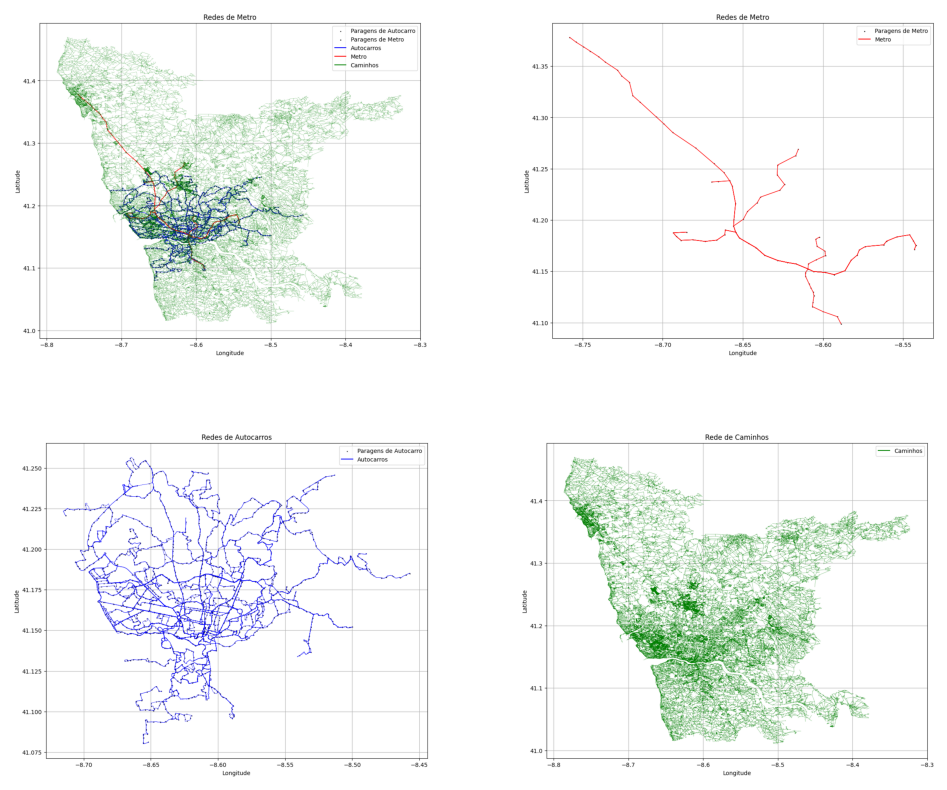

In [39]:
def PlotShapes(walk_df, bus_df, transit_df):
    plt.figure(figsize=(12, 10))

    print("A desenhar rotas de autocarro...")
    if 'shape_id' in bus_df.columns:
        for shape_id, group in bus_df.groupby('shape_id'):
            group = group.sort_values('shape_pt_sequence')
            plt.plot(group['shape_pt_lon'], group['shape_pt_lat'],
                     c='blue', alpha=1, linewidth=0.5)
    else:
        # fallback: try to plot any lon/lat columns if present
        if {'shape_pt_lon', 'shape_pt_lat'}.issubset(bus_df.columns):
            plt.plot(bus_df['shape_pt_lon'], bus_df['shape_pt_lat'],
                     c='blue', alpha=1, linewidth=0.5)
            
    print("Acrescentar os pontos de paragem de autocarro...")
    if {'stop_lon', 'stop_lat'}.issubset(stops_bus.columns):
        plt.scatter(stops_bus['stop_lon'], stops_bus['stop_lat'],
                    c='black', s=0.5, alpha=1, label='Paragens de Autocarro')
    
    print("A desenhar rotas de metro...")
    if 'shape_id' in transit_df.columns:
        for shape_id, group in transit_df.groupby('shape_id'):
            group = group.sort_values('shape_pt_sequence')
            plt.plot(group['shape_pt_lon'], group['shape_pt_lat'],
                     c='red', linewidth=0.8, alpha=1)
    else:
        if {'shape_pt_lon', 'shape_pt_lat'}.issubset(transit_df.columns):
            plt.plot(transit_df['shape_pt_lon'], transit_df['shape_pt_lat'],
                     c='red', linewidth=0.8, alpha=1)
            
    print("Acrescentar os pontos de paragem de metro...")
    if {'stop_lon', 'stop_lat'}.issubset(stops_transit.columns):
        plt.scatter(stops_transit['stop_lon'], stops_transit['stop_lat'],
                    c='black', s=0.8, alpha=1, label='Paragens de Metro')

    print("A desenhar estradas andantes...")
    for _, row in walk_df.iterrows():
        plt.plot([row['u_lon'], row['v_lon']], [row['u_lat'], row['v_lat']],
                 c='green', linewidth=0.2, alpha=1)


    # Legend handles
    plt.plot([], [], c='blue', label='Autocarros')
    plt.plot([], [], c='red', label='Metro')
    plt.plot([], [], c='green', label='Caminhos')

    plt.title("Redes de Metro")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True)
    plt.legend()
    plt.show()

#PlotShapes(shapes_walk, shapes_bus, shapes_transit)

# Load the PNG file
img1 = mpimg.imread("images/grid.png")
img2 = mpimg.imread("images/transitgrid.png")
img3 = mpimg.imread("images/busgrid.png")
img4 = mpimg.imread("images/walkgrid.png")

# Display the image
subplots = plt.subplots(2, 2, figsize=(12, 10))
plt.subplot(2, 2, 1)  
plt.imshow(img1)
plt.axis('off')
plt.subplot(2, 2, 2)
plt.imshow(img2)
plt.axis('off')
plt.subplot(2, 2, 3)
plt.imshow(img3)
plt.axis('off')
plt.subplot(2, 2, 4)
plt.imshow(img4)
plt.axis('off')
plt.show()

#### Grafo Walk

In [40]:
# Obtido a partir da biblioteca OSMNX
# https://geojson.io/#map=9.43/40.9863/-8.3466
polygon = {
  "type": "FeatureCollection",
  "features": [
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "coordinates": [
          [
            [
              -8.8,
              41.5
            ],
            [
              -8.8,
              41.0
            ],
            [
              -8.3,
              41
            ],
            [
              -8.3,
              41.5
            ],
            [
              -8.8,
              41.5
            ]
          ]
        ],
        "type": "Polygon"
      }
    }
  ]
}
"""# Converter GeoJSON para Shapely Polygon
poly_geom = shape(polygon["features"][0]["geometry"])

# Gerar grafo caminhável
G = ox.graph_from_polygon(poly_geom, network_type="walk")
print(f"Grafo walk criado: {len(G.nodes)} nós, {len(G.edges)} arestas")

G_walk = nx.Graph()
for u, v, data in G.edges(data=True):
    lat = G.nodes[u]['y']
    lon = G.nodes[u]['x']
    G_walk.add_node(u, y=lat, x=lon)
    lat = G.nodes[v]['y']
    lon = G.nodes[v]['x']
    G_walk.add_node(v, y=lat, x=lon)
    distance = HaversineDistance(
        G.nodes[u]['y'], G.nodes[u]['x'],
        G.nodes[v]['y'], G.nodes[v]['x'])
    time = distance / AVERAGE_SPEED_WALK
    G_walk.add_edge(u, v, length=distance, time=time, co2=0, mode='walk')

# Salvar o grafo
with open('graph/walk_graph.gpickle', 'wb') as f:
    pickle.dump(G_walk, f)"""
# Carregar o grafo
with open('graph/walk_graph.gpickle', 'rb') as f:
    G_walk = pickle.load(f)

In [41]:
# Mostrar Nodes e Edges
print(f"Grafo walk carregado: {len(G_walk.nodes)} nós, {len(G_walk.edges)} arestas")
# Obter um nó qualquer para exemplo (o ID 0 não existe necessariamente em dados OSM)
example_node_id = list(G_walk.nodes)[0]
print(f"O nó exemplo do grafo (ID: {example_node_id}) é: ", G_walk.nodes[example_node_id])
# Obter uma aresta qualquer para exemplo
print("A aresta exemplo do grafo é: ", list(G_walk.edges(data=True))[0])

Grafo walk carregado: 173318 nós, 231535 arestas
O nó exemplo do grafo (ID: 25450068) é:  {'y': 41.3400186, 'x': -8.5536223}
A aresta exemplo do grafo é:  (25450068, 5790027150, {'length': 239.8382319117409, 'time': 171.31302279410065, 'co2': 0, 'mode': 'walk'})


In [42]:
""" # Plot em HTML do grafo de caminhada
# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)
if 'crs' not in G_walk.graph:
	G_walk.graph['crs'] = 'EPSG:4326'

# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys
G_walk_plot = nx.MultiDiGraph(G_walk)
# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_walk_plot)
html_walk = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)
html_walk.save('graph/walk_graph.html')"""

" # Plot em HTML do grafo de caminhada\n# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)\nif 'crs' not in G_walk.graph:\n\tG_walk.graph['crs'] = 'EPSG:4326'\n\n# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys\nG_walk_plot = nx.MultiDiGraph(G_walk)\n# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.\ngdf_nodes, gdf_edges = ox.graph_to_gdfs(G_walk_plot)\nhtml_walk = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)\nhtml_walk.save('graph/walk_graph.html')"

#### Grafo Bus

In [43]:
def BusGraph(shapes_bus, stop, trips):
    G_bus = nx.DiGraph() 
    
    # Merge trip information to get shape_id
    stop_with_shape = stop.merge(trips[['trip_id', 'shape_id']], on='trip_id', how='left')

    def NearestShapePointIndex(shape_points: pd.DataFrame, coord: Tuple[float, float]) -> int:
        """Return index of nearest point in shape_points to coord (lat, lon)."""
        if shape_points.empty:
            return -1
        lats = shape_points['shape_pt_lat'].to_numpy()
        lons = shape_points['shape_pt_lon'].to_numpy()
        dists = np.array([HaversineDistance(coord[0], coord[1], lat, lon) for lat, lon in zip(lats, lons)])
        return int(dists.argmin())

    for trip_id, group in stop_with_shape.groupby('trip_id'):
        group = group.sort_values('stop_sequence')
        
        prev_node_id = None
        prev_coords = None
        prev_departure = None
        
        for _, row in group.iterrows():
            current_node_id = row['stop_id'] 
            current_coords = (row['stop_lat'], row['stop_lon'])
            current_arrival = row['arrival_seconds']

            G_bus.add_node(current_node_id, y=current_coords[0], x=current_coords[1])

            if prev_node_id is not None:
                shape_id = row['shape_id']
                shape_points = shapes_bus[shapes_bus['shape_id'] == shape_id].sort_values('shape_pt_sequence').reset_index(drop=True)
                distance = 0.0

                if shape_points.empty:
                    distance = HaversineDistance(prev_coords[0], prev_coords[1], current_coords[0], current_coords[1])
                else:
                    si = NearestShapePointIndex(shape_points, prev_coords)
                    ei = NearestShapePointIndex(shape_points, current_coords)

                    if si == -1 or ei == -1:
                        distance = HaversineDistance(prev_coords[0], prev_coords[1], current_coords[0], current_coords[1])
                    else:
                        if si <= ei:
                            idxs = list(range(si, ei + 1))
                        else:
                            idxs = list(range(si, ei - 1, -1))

                        first_pt = (shape_points.at[idxs[0], 'shape_pt_lat'], shape_points.at[idxs[0], 'shape_pt_lon'])
                        distance += HaversineDistance(prev_coords[0], prev_coords[1], first_pt[0], first_pt[1])

                        last_pt = first_pt
                        for j in idxs[1:]:
                            pt = (shape_points.at[j, 'shape_pt_lat'], shape_points.at[j, 'shape_pt_lon'])
                            distance += HaversineDistance(last_pt[0], last_pt[1], pt[0], pt[1])
                            last_pt = pt

                        distance += HaversineDistance(last_pt[0], last_pt[1], current_coords[0], current_coords[1])

                time = current_arrival - prev_departure if prev_departure is not None else 0
                co2 = EmissionCalculation(distance, 'bus')
                

                if G_bus.has_edge(prev_node_id, current_node_id):
                    existing_time = G_bus[prev_node_id][current_node_id]['time']
                    if time < existing_time:
                         G_bus.add_edge(prev_node_id, current_node_id, length=distance, time=time, co2=co2, mode='bus')
                else:
                    G_bus.add_edge(prev_node_id, current_node_id, length=distance, time=time, co2=co2, mode='bus')

            prev_node_id = current_node_id
            prev_coords = current_coords
            prev_departure = row['departure_seconds']
            
    return G_bus
"""# Filter stop data for bus mode only
stop_bus = stop[stop['mode'] == 'bus']
G_bus = BusGraph(shapes_bus, stop_bus, trips_bus)

# Guardar o grafo de autocarros
with open('graph/bus_graph.gpickle', 'wb') as f:
    pickle.dump(G_bus, f)"""

with open('graph/bus_graph.gpickle', 'rb') as f:
    # Carregar o grafo de autocarros
    G_bus = pickle.load(f)

In [44]:
# Mostrar Nodes e Edges
print(f"Grafo bus carregado: {len(G_bus.nodes)} nós, {len(G_bus.edges)} arestas")
# Obter um nó qualquer para exemplo (o ID 0 não existe necessariamente em dados OSM)
example_node_id = list(G_bus.nodes)[0]
print(f"O nó exemplo do grafo (ID: {example_node_id}) é: ", G_bus.nodes[example_node_id])
# Obter uma aresta qualquer para exemplo
print("A aresta exemplo do grafo é: ", list(G_bus.edges(data=True))[0])

Grafo bus carregado: 2502 nós, 2926 arestas
O nó exemplo do grafo (ID: B-VAL) é:  {'y': 41.0985018209741, 'x': -8.63180623040246}
A aresta exemplo do grafo é:  ('B-VAL', 'B-CPNH2', {'length': 389.36411070965886, 'time': 39, 'co2': 42.79111576699151, 'mode': 'bus'})


In [45]:
"""# Plot em HTML do grafo do autocarro
# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)
if 'crs' not in G_bus.graph:
	G_bus.graph['crs'] = 'EPSG:4326'

# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys
G_bus_plot = nx.MultiDiGraph(G_bus)
# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_bus_plot)
html_bus = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)
html_bus.save('graph/bus_graph.html')"""

"# Plot em HTML do grafo do autocarro\n# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)\nif 'crs' not in G_bus.graph:\n\tG_bus.graph['crs'] = 'EPSG:4326'\n\n# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys\nG_bus_plot = nx.MultiDiGraph(G_bus)\n# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.\ngdf_nodes, gdf_edges = ox.graph_to_gdfs(G_bus_plot)\nhtml_bus = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)\nhtml_bus.save('graph/bus_graph.html')"

#### Grafo Transit

In [46]:
def TransitGraph(shapes_transit, stop, trips):
    G_transit = nx.DiGraph() 
    
    # Merge trip information to get shape_id
    stop_with_shape = stop.merge(trips[['trip_id', 'shape_id']], on='trip_id', how='left')

    def NearestShapePointIndex(shape_points: pd.DataFrame, coord: Tuple[float, float]) -> int:
        """Return index of nearest point in shape_points to coord (lat, lon)."""
        if shape_points.empty:
            return -1
        lats = shape_points['shape_pt_lat'].to_numpy()
        lons = shape_points['shape_pt_lon'].to_numpy()
        dists = np.array([HaversineDistance(coord[0], coord[1], lat, lon) for lat, lon in zip(lats, lons)])
        return int(dists.argmin())

    for trip_id, group in stop_with_shape.groupby('trip_id'):
        group = group.sort_values('stop_sequence')
        
        prev_node_id = None
        prev_coords = None
        prev_departure = None
        
        for _, row in group.iterrows():
            current_node_id = row['stop_id'] 
            current_coords = (row['stop_lat'], row['stop_lon'])
            current_arrival = row['arrival_seconds']

            G_transit.add_node(current_node_id, y=current_coords[0], x=current_coords[1])

            if prev_node_id is not None:
                shape_id = row['shape_id']
                shape_points = shapes_transit[shapes_transit['shape_id'] == shape_id].sort_values('shape_pt_sequence').reset_index(drop=True)
                distance = 0.0

                if shape_points.empty:
                    distance = HaversineDistance(prev_coords[0], prev_coords[1], current_coords[0], current_coords[1])
                else:
                    si = NearestShapePointIndex(shape_points, prev_coords)
                    ei = NearestShapePointIndex(shape_points, current_coords)

                    if si == -1 or ei == -1:
                        distance = HaversineDistance(prev_coords[0], prev_coords[1], current_coords[0], current_coords[1])
                    else:
                        if si <= ei:
                            idxs = list(range(si, ei + 1))
                        else:
                            idxs = list(range(si, ei - 1, -1))

                        first_pt = (shape_points.at[idxs[0], 'shape_pt_lat'], shape_points.at[idxs[0], 'shape_pt_lon'])
                        distance += HaversineDistance(prev_coords[0], prev_coords[1], first_pt[0], first_pt[1])

                        last_pt = first_pt
                        for j in idxs[1:]:
                            pt = (shape_points.at[j, 'shape_pt_lat'], shape_points.at[j, 'shape_pt_lon'])
                            distance += HaversineDistance(last_pt[0], last_pt[1], pt[0], pt[1])
                            last_pt = pt

                        distance += HaversineDistance(last_pt[0], last_pt[1], current_coords[0], current_coords[1])

                time = current_arrival - prev_departure if prev_departure is not None else 0
                co2 = EmissionCalculation(distance, 'transit')
                

                if G_transit.has_edge(prev_node_id, current_node_id):
                    existing_time = G_transit[prev_node_id][current_node_id]['time']
                    if time < existing_time:
                         G_transit.add_edge(prev_node_id, current_node_id, length=distance, time=time, co2=co2, mode='transit')
                else:
                    G_transit.add_edge(prev_node_id, current_node_id, length=distance, time=time, co2=co2, mode='transit')

            prev_node_id = current_node_id
            prev_coords = current_coords
            prev_departure = row['departure_seconds']
            
    return G_transit


"""# Filter stop data for transit mode only
stop_transit = stop[stop['mode'] == 'transit']
G_transit = TransitGraph(shapes_transit, stop_transit, trips_transit)

# Guardar o grafo do metro
with open('graph/transit_graph.gpickle', 'wb') as f:
    pickle.dump(G_transit, f)"""

with open('graph/transit_graph.gpickle', 'rb') as f:
    # Carregar o grafo do metro
    G_transit = pickle.load(f)

In [47]:
# Mostrar Nodes e Edges
print(f"Grafo transit carregado: {len(G_transit.nodes)} nós, {len(G_transit.edges)} arestas")
# Obter um nó qualquer para exemplo (o ID 0 não existe necessariamente em dados OSM)
example_node_id = list(G_transit.nodes)[0]
print(f"O nó exemplo do grafo (ID: {example_node_id}) é: ", G_transit.nodes[example_node_id])
# Obter uma aresta qualquer para exemplo
print("A aresta exemplo do grafo é: ", list(G_transit.edges(data=True))[0])

Grafo transit carregado: 85 nós, 180 arestas
O nó exemplo do grafo (ID: T-5708) é:  {'y': 41.16072, 'x': -8.582416}
A aresta exemplo do grafo é:  ('T-5708', 'T-5703', {'length': 1178.7727009369137, 'time': 120, 'co2': 47.15090803747655, 'mode': 'transit'})


In [48]:
"""# Plot em HTML do grafo do autocarro
# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)
if 'crs' not in G_transit.graph:
	G_transit.graph['crs'] = 'EPSG:4326'

# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys
G_transit_plot = nx.MultiDiGraph(G_transit)
# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_transit_plot)
html_transit = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)
html_transit.save('graph/transit_graph.html')"""

"# Plot em HTML do grafo do autocarro\n# Adicionar CRS ao grafo se não existir (necessário para funções do osmnx)\nif 'crs' not in G_transit.graph:\n\tG_transit.graph['crs'] = 'EPSG:4326'\n\n# OSMnx plotting functions require a MultiGraph/MultiDiGraph to support edge keys\nG_transit_plot = nx.MultiDiGraph(G_transit)\n# ox.plot_graph_folium was removed in osmnx v2.0. Using geopandas explore instead.\ngdf_nodes, gdf_edges = ox.graph_to_gdfs(G_transit_plot)\nhtml_transit = gdf_edges.explore(color='gray', tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)\nhtml_transit.save('graph/transit_graph.html')"

#### Grafo Multimodal

In [49]:
def MultiModalGraph(G_walk: nx.Graph, G_bus: nx.Graph, G_transit: nx.Graph, stops_bus_df: pd.DataFrame, stops_transit_df: pd.DataFrame, stop_times_bus_df: pd.DataFrame, stop_times_transit_df: pd.DataFrame) -> nx.MultiGraph:

    G_multi = nx.MultiGraph(G_walk)
    
    nx.set_edge_attributes(G_multi, 'walk', name='mode')

    walk_nodes_data = []
    walk_node_ids = []
    
    print("2. A construir índice espacial (KDTree)...")
    for n, d in G_multi.nodes(data=True):

        y = d.get('y', d.get('lat'))
        x = d.get('x', d.get('lon'))
        
        if y is not None and x is not None:
            walk_nodes_data.append([y, x])
            walk_node_ids.append(n) 
            
    walk_coords_arr = np.array(walk_nodes_data)
    walk_node_ids = np.array(walk_node_ids) 
    
    tree = cKDTree(walk_coords_arr)

    def get_nearest_node_fast(lat, lon):
        dist, idx = tree.query([lat, lon], k=1)
        return walk_node_ids[idx] 
    
    def _time_to_seconds(t: str) -> int:
        try:
            h, m, s = map(int, t.split(':'))
            return h * 3600 + m * 60 + s
        except:
            return 0

    # Função para adicionar transportes
    def add_transport_layer(source_graph, mode_name, desc):
        edges_to_add = []
        # Adicionar arestas do grafo de transporte
        for u, v, data in tqdm(source_graph.edges(data=True), desc=desc):
            dist = data.get('length', data.get('distance', 0))
            time_val = data.get('time', 0)
            co2_val = data.get('co2', 0)
            
            edges_to_add.append((u, v, {
                'length': dist, 
                'time': time_val, 
                'co2': co2_val, 
                'mode': mode_name
            }))
            
        G_multi.add_edges_from(edges_to_add)

    add_transport_layer(G_bus, 'bus', "3. A adicionar arestas Autocarro")
    add_transport_layer(G_transit, 'transit', "4. A adicionar arestas Metro")

    def link_stops_to_walk(stops_df, mode_name, desc):
        unique_stops = stops_df[['stop_id', 'stop_lat', 'stop_lon']].drop_duplicates()
        edges_to_add = []
        
        for _, row in tqdm(unique_stops.iterrows(), total=unique_stops.shape[0], desc=desc):
            stop_id = row['stop_id'] # ID original do DF (geralmente string ou int)
            lat, lon = row['stop_lat'], row['stop_lon']
            
            if not G_multi.has_node(stop_id):
                G_multi.add_node(stop_id, y=lat, x=lon, mode=mode_name)
            else:
                G_multi.nodes[stop_id]['y'] = lat
                G_multi.nodes[stop_id]['x'] = lon
                G_multi.nodes[stop_id]['mode'] = mode_name
            
            # Encontrar nó de caminhada mais próximo
            nearest_walk_id = get_nearest_node_fast(lat, lon)
            
            # Dados do nó de caminhada
            nn_data = G_multi.nodes[nearest_walk_id]
            nn_lat = nn_data.get('y', nn_data.get('lat'))
            nn_lon = nn_data.get('x', nn_data.get('lon'))
            
            dist = HaversineDistance(lat, lon, nn_lat, nn_lon)
            time_val = dist / AVERAGE_SPEED_WALK
            co2_val = EmissionCalculation(dist, 'walk')
            
            edges_to_add.append((stop_id, nearest_walk_id, {
                'length': dist, 
                'time': time_val, 
                'co2': co2_val, 
                'mode': 'transfer_walk'
            }))
            
        G_multi.add_edges_from(edges_to_add)

    link_stops_to_walk(stops_bus_df, 'bus', "5. A ligar Paragens Bus -> Walk")
    link_stops_to_walk(stops_transit_df, 'transit', "6. A ligar Paragens Metro -> Walk")

    # Processar Horários
    def process_schedules(stop_times_df, mode_name):
        if stop_times_df is None: return
        print(f"7. A processar horários de {mode_name}...")
        
        grouped = stop_times_df.groupby('stop_id')
        for stop_id, group in tqdm(grouped):
            if G_multi.has_node(stop_id):
                trips = group['trip_id'].values
                arrivals = [_time_to_seconds(t) for t in group['arrival_time'].values]
                departures = [_time_to_seconds(t) for t in group['departure_time'].values]
                
                schedule_list = []
                for t_id, arr, dep in zip(trips, arrivals, departures):
                    schedule_list.append({
                        'trip_id': t_id,
                        'arrival_time': arr,
                        'departure_time': dep,
                        'mode': mode_name
                    })
                G_multi.nodes[stop_id]['schedules'] = schedule_list

    process_schedules(stop_times_bus_df, 'bus')
    process_schedules(stop_times_transit_df, 'transit')

    return G_multi
"""
print("A iniciar construção...")
G_Multi = MultiModalGraph(G_walk, G_bus, G_transit, stops_bus, stops_transit, stop_times_bus, stop_times_transit)
print(f"Grafo criado com {len(G_Multi.nodes)} nós e {len(G_Multi.edges)} arestas.")
print("A guardar em ficheiro...")
with open('graph/multimodal_graph.gpickle', 'wb') as f:
    pickle.dump(G_Multi, f)
print("Concluído.")"""
with open('graph/multimodal_graph.gpickle', 'rb') as f:
    # Carregar o grafo
    G_Multi = pickle.load(f)


In [50]:
# Mostrar Nodes e Edges
print(f"Grafo Multi carregado: {len(G_Multi.nodes)} nós, {len(G_Multi.edges)} arestas")
# Obter um nó qualquer para exemplo (o ID 0 não existe necessariamente em dados OSM)
example_node_id_bus = None
example_node_id_transit = None

for node in G_Multi.nodes:
	if isinstance(node, str) and node.startswith('B-'):
		example_node_id_bus = node
		break

for node in G_Multi.nodes:
	if isinstance(node, str) and node.startswith('T-'):
		example_node_id_transit = node
		break

for node in G_Multi.nodes:
	if not isinstance(node, str):
		example_node_id_walk = node
		break

# Procurar aresta tranfer_walk
found_transfer_walk = False
for u, v, data in G_Multi.edges(data=True):
	if data.get('mode') == 'transfer_walk':
		found_transfer_walk = True
		break


if example_node_id_bus:
	print(f"O nó exemplo do grafo (ID: {example_node_id_bus}) é: ", G_Multi.nodes[example_node_id_bus])
else:
	print("Nenhum nó de autocarro encontrado")

if example_node_id_transit:
	print(f"O nó exemplo do grafo (ID: {example_node_id_transit}) é: ", G_Multi.nodes[example_node_id_transit])
else:
	print("Nenhum nó de metro encontrado")

if example_node_id_walk:
	print(f"O nó exemplo do grafo (ID: {example_node_id_walk}) é: ", G_Multi.nodes[example_node_id_walk])
else:
	print("Nenhum nó de caminhada encontrado")

if found_transfer_walk:
	print(f"A aresta exemplo do grafo é: ", (u, v, data))
else:
	print("Nenhuma aresta 'transfer_walk' encontrada no grafo.")

for example_aresta_bus in G_Multi.edges(data=True):
	if example_aresta_bus[2].get('mode') == 'bus':
		print("A aresta exemplo do grafo é: ", example_aresta_bus)
		break

for example_aresta_transit in G_Multi.edges(data=True):
	if example_aresta_transit[2].get('mode') == 'transit':
		print("A aresta exemplo do grafo é: ", example_aresta_transit)
		break


# Obter uma aresta qualquer para exemplo
print("A aresta exemplo do grafo é: ", list(G_Multi.edges(data=True))[0])

Grafo Multi carregado: 175905 nós, 237228 arestas
O nó exemplo do grafo (ID: B-VAL) é:  {'y': 41.0985018209741, 'x': -8.63180623040246, 'mode': 'bus', 'schedules': [{'trip_id': '901_1_D_1', 'arrival_time': 19991, 'departure_time': 19991, 'mode': 'bus'}, {'trip_id': '901_1_D_3', 'arrival_time': 26291, 'departure_time': 26291, 'mode': 'bus'}, {'trip_id': '901_1_D_5', 'arrival_time': 32891, 'departure_time': 32891, 'mode': 'bus'}, {'trip_id': '901_1_D_7', 'arrival_time': 39491, 'departure_time': 39491, 'mode': 'bus'}, {'trip_id': '901_1_D_9', 'arrival_time': 46091, 'departure_time': 46091, 'mode': 'bus'}, {'trip_id': '901_1_D_11', 'arrival_time': 53015, 'departure_time': 53015, 'mode': 'bus'}, {'trip_id': '901_1_D_13', 'arrival_time': 67991, 'departure_time': 67991, 'mode': 'bus'}, {'trip_id': '901_1_D_15', 'arrival_time': 61391, 'departure_time': 61391, 'mode': 'bus'}, {'trip_id': '901_1_D_17', 'arrival_time': 76691, 'departure_time': 76691, 'mode': 'bus'}, {'trip_id': '901_1_D_19', 'arr

In [51]:
"""# Criar listas para nós e arestas
nodes_list = []
edges_list = []

# Processar nós
for node, data in G_Multi.nodes(data=True):
    lat = data.get('y', data.get('lat'))
    lon = data.get('x', data.get('lon'))
    
    if lat is not None and lon is not None:
        nodes_list.append({
            'node_id': node,
            'geometry': Point(lon, lat),
            'lat': lat,
            'lon': lon
        })

# Processar arestas
for u, v, key, data in G_Multi.edges(data=True, keys=True):
    u_data = G_Multi.nodes[u]
    v_data = G_Multi.nodes[v]
    
    u_lat = u_data.get('y', u_data.get('lat'))
    u_lon = u_data.get('x', u_data.get('lon'))
    v_lat = v_data.get('y', v_data.get('lat'))
    v_lon = v_data.get('x', v_data.get('lon'))
    
    if all([u_lat, u_lon, v_lat, v_lon]):
        edges_list.append({
            'u': u,
            'v': v,
            'geometry': LineString([(u_lon, u_lat), (v_lon, v_lat)]),
            'mode': data.get('mode', 'unknown'),
            'length': data.get('length', 0),
            'time': data.get('time', 0)
        })

# Criar GeoDataFrames
gdf_edges = gpd.GeoDataFrame(edges_list, crs='EPSG:4326')

# Definir cores por modo
def edge_color_mode(mode):
    if mode == 'walk':
        return 'green'
    elif mode == 'bus':
        return 'blue'
    elif mode == 'transit':
        return 'red'
    elif mode == 'transfer_walk':
        return 'orange'
    else:
        return 'gray'

# Aplica as cores
edge_colors = gdf_edges['mode'].apply(edge_color_mode)

# Plotar todas as arestas num mapa interativo
html_multi = gdf_edges.explore(color=edge_colors, tiles='cartodbpositron', style_kwds={'weight': 2}, popup=False)

html_multi.save('graph/multimodal_graph.html')"""

"# Criar listas para nós e arestas\nnodes_list = []\nedges_list = []\n\n# Processar nós\nfor node, data in G_Multi.nodes(data=True):\n    lat = data.get('y', data.get('lat'))\n    lon = data.get('x', data.get('lon'))\n\n    if lat is not None and lon is not None:\n        nodes_list.append({\n            'node_id': node,\n            'geometry': Point(lon, lat),\n            'lat': lat,\n            'lon': lon\n        })\n\n# Processar arestas\nfor u, v, key, data in G_Multi.edges(data=True, keys=True):\n    u_data = G_Multi.nodes[u]\n    v_data = G_Multi.nodes[v]\n\n    u_lat = u_data.get('y', u_data.get('lat'))\n    u_lon = u_data.get('x', u_data.get('lon'))\n    v_lat = v_data.get('y', v_data.get('lat'))\n    v_lon = v_data.get('x', v_data.get('lon'))\n\n    if all([u_lat, u_lon, v_lat, v_lon]):\n        edges_list.append({\n            'u': u,\n            'v': v,\n            'geometry': LineString([(u_lon, u_lat), (v_lon, v_lat)]),\n            'mode': data.get('mode', 'unknown'

### **Função de Avaliação**

In [52]:

def EvaluatePath(G, path):
    total_time = 0
    total_co2 = 0
    total_walk_dist = 0
    transfers = 0
    last_trip_id = None
    
    for i in range(len(path) - 1):
        u, v = path[i], path[i+1]
        edge_data = G.get_edge_data(u, v)
        
        if edge_data is None:
            continue
        
        # Handle MultiGraph by getting the first edge data
        if isinstance(edge_data, dict):
            # Get the first key (could be 0 or any other key)
            first_key = next(iter(edge_data))
            data = edge_data[first_key]
        else:
            data = edge_data
        
        total_time += data.get('time', 0) # Tempo em segundos 
        total_co2 += data.get('co2', 0)
        
        # Contar transferências
        current_trip_id = data.get('trip_id')
        if current_trip_id and last_trip_id and current_trip_id != last_trip_id:
            transfers += 1
        if current_trip_id:
            last_trip_id = current_trip_id
        
        # Distância a pé
        if data.get('mode') == 'walk':
            total_walk_dist += data.get('distance', 0)

    # Calorias aproximadas
    calories = total_walk_dist * 0.05
    
    return {
        'time': total_time,
        'co2': total_co2,
        'transfers': transfers,
        'walk_dist': total_walk_dist,
        'calories': calories
    }

### **Algoritmos de Procura**

#### A*

In [53]:
# Algoritmo A* 
def AStarSearchVisual(graph: nx.MultiGraph, start_coords, end_coords, weight='time'):
    
    start_node = NearestGraphNode(graph, start_coords)
    end_node = NearestGraphNode(graph, end_coords)

    print(f"A procurar caminho de {start_node} para {end_node}...")

    # Obter coordenadas do destino para a Heurística
    try:
        end_data = graph.nodes[end_node]
        end_y = end_data.get('y', end_data.get('lat'))
        end_x = end_data.get('x', end_data.get('lon'))
    except KeyError:
        print("Erro: O nó de destino não tem coordenadas.")
        return [], []

    # Função Heurística Local (Distância Real até ao destino)
    def heuristic(node_id):
        try:
            node_data = graph.nodes[node_id]
            ny = node_data.get('y', node_data.get('lat'))
            nx = node_data.get('x', node_data.get('lon'))

            dist = HaversineDistance(ny, nx, end_y, end_x)
            if weight == 'time':
                return dist / 1.1 # 1.1 m/s (~4km/h) como velocidade base conservadora a pé
            return dist
        except:
            return float('inf')

    # Inicialização A*
    open_set = []
    counter = 0  # Contador único para evitar comparação de nós
    heapq.heappush(open_set, (0, counter, start_node))
    
    came_from = {}
    g_score = {start_node: 0}
    f_score = {start_node: heuristic(start_node)}
    
    visited_edges = []
    nodes_visited_count = 0

    while open_set:
        current = heapq.heappop(open_set)[2]  # Agora o nó está na posição 2
        nodes_visited_count += 1

        if current == end_node:
            print(f"Caminho encontrado! Nós explorados: {nodes_visited_count}")
            # Reconstruir caminho
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start_node)
            path.reverse()
            return path, visited_edges

        # Explorar vizinhos
        for neighbor in graph.neighbors(current):

            all_edges = graph.get_edge_data(current, neighbor)

            min_edge_weight = float('inf')
            
            for key, attr in all_edges.items():
                w = attr.get(weight, float('inf'))
                if w < min_edge_weight:
                    min_edge_weight = w
            
            edge_weight = min_edge_weight

            if edge_weight == float('inf'):
                continue

            tentative_g_score = g_score[current] + edge_weight

            if neighbor not in g_score or tentative_g_score < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g_score
                f_score[neighbor] = tentative_g_score + heuristic(neighbor)
                
                counter += 1  # Incrementar contador para manter ordem de inserção
                heapq.heappush(open_set, (f_score[neighbor], counter, neighbor))
                
                # Adicionar à lista de visualização
                visited_edges.append((current, neighbor))

    print("Caminho não encontrado.")
    return [], visited_edges

#### Dijkstra

In [54]:
# Algoritmo Dijkstra
def DijkstraSearchVisual(graph: nx.MultiGraph, start_coords, end_coords, weight='time'):

    start_node = NearestGraphNode(graph, start_coords)
    end_node = NearestGraphNode(graph, end_coords)

    print(f"Dijkstra: A procurar de {start_node} para {end_node}...")

    # Inicialização
    open_set = []
    counter = 0  # Contador único para evitar comparação de nós
    heapq.heappush(open_set, (0, counter, start_node))
    
    came_from = {}
    g_score = {start_node: 0}
    
    visited_edges = []
    nodes_visited_count = 0

    while open_set:
        current_cost, _, current = heapq.heappop(open_set)  # Extrair nó da posição 2
        nodes_visited_count += 1

        # Encontrou o destino
        if current == end_node:
            print(f"Dijkstra concluído! Nós explorados: {nodes_visited_count}")
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start_node)
            path.reverse()
            return path, visited_edges
        
        if current_cost > g_score.get(current, float('inf')):
            continue

        for neighbor in graph.neighbors(current):

            all_edges = graph.get_edge_data(current, neighbor)
            
            # Encontrar o menor peso entre as múltiplas arestas disponíveis
            min_edge_weight = float('inf')
            
            for key, attr in all_edges.items():
                w = attr.get(weight, float('inf'))
                if w < min_edge_weight:
                    min_edge_weight = w
            
            edge_weight = min_edge_weight

            # Se não houver peso válido, ignora
            if edge_weight == float('inf'):
                continue

            tentative_g_score = g_score[current] + edge_weight

            # Relaxamento da Aresta
            if neighbor not in g_score or tentative_g_score < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g_score
                
                # No Dijkstra, a prioridade é puramente o custo acumulado (g)
                counter += 1  # Incrementar contador
                heapq.heappush(open_set, (tentative_g_score, counter, neighbor))
                
                # Guardar aresta para a animação
                visited_edges.append((current, neighbor))
                
    print("Dijkstra: Caminho não encontrado.")
    return [], visited_edges

#### Comparação

In [55]:
# Função de Animação da Busca
def AnimateBattle(G, visit_a, path_a, visit_d, path_d, start, end, skip=20):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), facecolor='black')
    
    # 1. Definição das cores por modo de transporte
    mode_colors = {
        'walk': 'lime', 
        'bus': 'cyan', 
        'transit': 'red', 
    }
    default_color = 'white'

    configs = [
        (ax1, "A*", visit_a, path_a, 'lightblue'),
        (ax2, "Dijkstra", visit_d, path_d, 'lightgreen'),
    ]
    
    exploring_lines = []
    final_collections = []

    def get_coords(n):
        # Se for tupla de floats, já é (lat, lon)
        if isinstance(n, tuple) and len(n) == 2 and isinstance(n[0], (int, float)):
            return n
        # Se for ID (string ou int), buscar no grafo
        try:
            node_data = G.nodes[n]
            # Tenta chaves 'y'/'x' ou 'lat'/'lon'
            lat = node_data.get('y', node_data.get('lat'))
            lon = node_data.get('x', node_data.get('lon'))
            return (lat, lon)
        except:
            return (0, 0) # Fallback para evitar erros

    # Coletar todas as coordenadas visitadas para ajustar o zoom (Dijkstra cobre mais área)
    # Usamos um set para evitar duplicados e processar mais rápido
    all_nodes_visited = set()
    for u, v in visit_d:
        all_nodes_visited.add(u)
        all_nodes_visited.add(v)
    
    # Converter nós para coordenadas
    all_coords = [get_coords(n) for n in all_nodes_visited]
    
    # Separar lats e lons, filtrando inválidos (0,0) se necessário
    lats = [c[0] for c in all_coords if c != (0,0)]
    lons = [c[1] for c in all_coords if c != (0,0)]
    
    # Se a lista estiver vazia (caso raro), usa start/end
    if not lats:
        lats = [start[0], end[0]]
        lons = [start[1], end[1]]

    # Configuração dos eixos
    for ax, title, visit, path, color in configs:
        ax.set_facecolor('black')
        ax.set_title(title, color='white', fontsize=14)
        ax.axis('off')
        
        # Ajustar limites com margem
        ax.set_xlim(min(lons)-0.005, max(lons)+0.005)
        ax.set_ylim(min(lats)-0.005, max(lats)+0.005)
        
        # Start/End points
        ax.scatter(start[1], start[0], c='white', s=50, zorder=10)
        ax.scatter(end[1], end[0], c='red', s=50 , zorder=10)
        
        # Linha de exploração
        ln, = ax.plot([], [], color=color, alpha=0.4, linewidth=1)
        exploring_lines.append(ln)
        
        # Linha Final
        lc = LineCollection([], linewidths=2, alpha=0.9)
        ax.add_collection(lc)
        final_collections.append(lc)

    def update(frame):
        idx = frame * skip
        artists = []
        
        for i, (_, _, visit, path, _) in enumerate(configs):
            # 1. Atualizar Animação de Exploração
            if idx < len(visit):
                xs, ys = [], []
                # Construir segmentos usando a função get_coords
                for u, v in visit[:idx+skip]: 
                    cu = get_coords(u)
                    cv = get_coords(v)
                    xs.extend([cu[1], cv[1], None])
                    ys.extend([cu[0], cv[0], None])
                exploring_lines[i].set_data(xs, ys)
            
            # 2. Desenhar Caminho Final Colorido
            if idx >= len(visit) and path:
                segments = []
                colors = []
                
                for k in range(len(path) - 1):
                    u = path[k]
                    v = path[k+1]
                    
                    edge_data = G.get_edge_data(u, v)
                    if edge_data is not None:
                        if 0 in edge_data: edge_data = edge_data[0]
                        mode = edge_data.get('mode', 'walk')
                        color = mode_colors.get(mode, default_color)
                        
                        cu = get_coords(u)
                        cv = get_coords(v)
                        
                        # (lon, lat) para o plot
                        segments.append([(cu[1], cu[0]), (cv[1], cv[0])])
                        colors.append(color)
                
                final_collections[i].set_segments(segments)
                final_collections[i].set_color(colors)
            
            artists.append(exploring_lines[i])
            artists.append(final_collections[i])
        
        return artists
    
    max_len = max(len(visit_a), len(visit_d))
    frames = (max_len // skip) + 30 
    
    anim = FuncAnimation(fig, update, frames=frames, interval=20, blit=True)
    plt.close()
    return anim

"""mapping = {}
for n, data in G_walk.nodes(data=True):
    if 'y' in data and 'x' in data:
        mapping[n] = (data['y'], data['x'])

# Relabel nodes in G_Multi. Nodes not in mapping (like the GTFS stop tuples) are kept as is.
G_Multi = nx.relabel_nodes(G_Multi, mapping, copy=False)

# Definir nós de início e fim (com valores aleatórios dentro da área do Porto)
start_node = stops_bus.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]
end_node = stops_transit.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]  

print("1. A calcular A*...")
path_ast, visit_ast = AStarSearchVisual(G_Multi, start_node, end_node, weight='time')
print(f"A* Dinâmico explorou {len(visit_ast)} ruas.")
print(f"Caminho A* encontrado com {len(path_ast)} nós.")

print("2. A calcular Dijkstra...")
path_dij, visit_dij = DijkstraSearchVisual(G_Multi, start_node, end_node, weight='time')

print(f"Comparação: A* explorou {len(visit_ast)} ruas, Dijkstra explorou {len(visit_dij)} ruas.")

# Animação comparativa
# Executar a batalha dupla  
anim_ = AnimateBattle(G_Multi, visit_ast, path_ast, 
                                visit_dij, path_dij, 
                                start_node, end_node, skip=200)
plt.rcParams['animation.embed_limit'] = 50000000  # Aumentar o limite de incorporação para animações maiores
HTML(anim_.to_jshtml())"""

'mapping = {}\nfor n, data in G_walk.nodes(data=True):\n    if \'y\' in data and \'x\' in data:\n        mapping[n] = (data[\'y\'], data[\'x\'])\n\n# Relabel nodes in G_Multi. Nodes not in mapping (like the GTFS stop tuples) are kept as is.\nG_Multi = nx.relabel_nodes(G_Multi, mapping, copy=False)\n\n# Definir nós de início e fim (com valores aleatórios dentro da área do Porto)\nstart_node = stops_bus.sample(1).apply(lambda row: (row[\'stop_lat\'], row[\'stop_lon\']), axis=1).values[0]\nend_node = stops_transit.sample(1).apply(lambda row: (row[\'stop_lat\'], row[\'stop_lon\']), axis=1).values[0]  \n\nprint("1. A calcular A*...")\npath_ast, visit_ast = AStarSearchVisual(G_Multi, start_node, end_node, weight=\'time\')\nprint(f"A* Dinâmico explorou {len(visit_ast)} ruas.")\nprint(f"Caminho A* encontrado com {len(path_ast)} nós.")\n\nprint("2. A calcular Dijkstra...")\npath_dij, visit_dij = DijkstraSearchVisual(G_Multi, start_node, end_node, weight=\'time\')\n\nprint(f"Comparação: A* explo

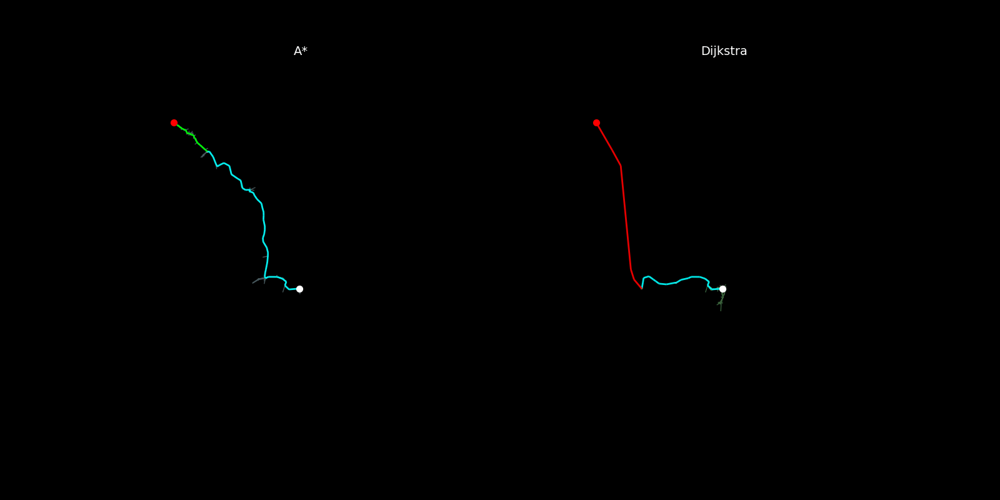

In [56]:
"""print("A guardar GIF... isto pode demorar um pouco.")
anim_.save("videos/InitComparison.gif", writer='pillow', fps=30)
print("Guardado com sucesso!")"""
# Mostrar o GIF guardado
display(Image(filename="videos/InitComparison.gif"))

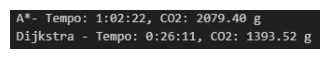

In [57]:
"""# Comparar os resultados
eval_ast = EvaluatePath(G_Multi, path_ast)
eval_dij = EvaluatePath(G_Multi, path_dij)
print(f"A*- Tempo: {SecondsToHMS(int(eval_ast['time']))}, CO2: {eval_ast['co2']:.2f} g")
print(f"Dijkstra - Tempo: {SecondsToHMS(int(eval_dij['time']))}, CO2: {eval_dij['co2']:.2f} g")"""
img5 = mpimg.imread("images/initcomparison.png")
plt.figure(figsize=(4,2))
plt.imshow(img5)
plt.axis('off') 
plt.show()

#### A* Dynamic

A calcular A* Dinâmico...
Nó de Início: (41.2252500134393, -8.63972216225865)
Nó de Fim: (41.18577, -8.661189)
Início A* Dinâmico às 9:00:00 no dia 20251203...


A filtrar serviços ativos para o dia...
Serviços prontos. Bus: 5704, Transit: 1153
Destino alcançado! Nós expandidos: 107
A* explorou 191 arestas.
Caminho final tem 72 nós.


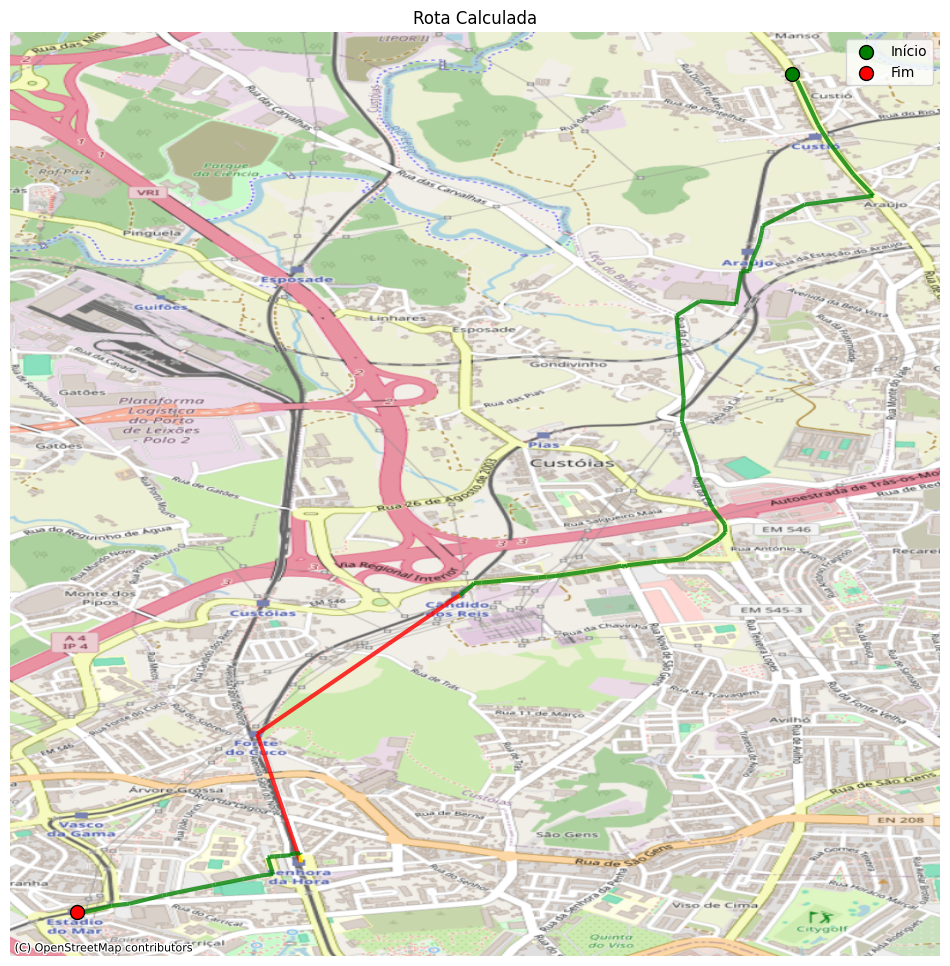

In [58]:
# A* Dinâmico com horários e espera
def AStarDynamicSearchVisual(graph: nx.Graph, start, end, hour, day, weight='time', 
                      trips_bus=None, calendar_bus=None, calendar_dates_bus=None, 
                      trips_transit=None, calendar_transit=None, calendar_dates_transit=None):
    
    print(f"Início A* Dinâmico às {SecondsToHMS(hour)} no dia {day}...")
    
    # 1. Resolver nós mais próximos se não existirem no grafo
    if start not in graph: start = NearestGraphNode(graph, start)
    if end not in graph: end = NearestGraphNode(graph, end)

    # --- FUNÇÃO AUXILIAR PARA OBTER COORDENADAS (CORREÇÃO) ---
    def get_coords(n):
        # Se for tupla de floats, assume que já é (lat, lon)
        if isinstance(n, tuple) and len(n) == 2 and isinstance(n[0], (int, float)):
            return n
        # Se for ID (string ou int), buscar atributos no grafo
        try:
            node_data = graph.nodes[n]
            # Tenta chaves 'y'/'x' (osmnx) ou 'lat'/'lon'
            lat = node_data.get('y', node_data.get('lat'))
            lon = node_data.get('x', node_data.get('lon'))
            return (lat, lon)
        except KeyError:
            # Caso extremo de falha, retorna 0,0 para não quebrar (ou trate o erro)
            return (0.0, 0.0)

    # Coordenadas fixas do destino para a heurística
    end_coords = get_coords(end)
    start_coords = get_coords(start)

    # 2. Preparar serviços ativos
    print("A filtrar serviços ativos para o dia...")
    active_bus_ids = set()
    active_transit_ids = set()

    if trips_bus is not None:
        active_bus_df = GetActiveServices(f"{day}", calendar_bus, calendar_dates_bus, trips_bus)
        active_bus_ids = set(active_bus_df['trip_id'].values)
    
    if trips_transit is not None:
        active_transit_df = GetActiveServices(f"{day}", calendar_transit, calendar_dates_transit, trips_transit)
        active_transit_ids = set(active_transit_df['trip_id'].values)
        
    print(f"Serviços prontos. Bus: {len(active_bus_ids)}, Transit: {len(active_transit_ids)}")

    # 3. Inicialização do A*
    open_set = []
    # (f_score, tie_breaker_counter, node_id) - contador ajuda no desempate do heapq
    counter = itertools.count() 
    heapq.heappush(open_set, (0, next(counter), start)) 
    
    came_from = {}
    g_score = {start: 0}
    
    # Heurística inicial (usando get_coords)
    f_score = {start: HaversineDistance(start_coords[0], start_coords[1], end_coords[0], end_coords[1])}
    
    visited_edges = []
    nodes_expanded = 0

    while open_set:
        _, _, current = heapq.heappop(open_set)
        nodes_expanded += 1

        if current == end:
            print(f"Destino alcançado! Nós expandidos: {nodes_expanded}")
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)
            path.reverse()
            return path, visited_edges

        # Hora atual neste nó
        current_time_at_node = hour + g_score[current]

        for neighbor in graph.neighbors(current):
            
            custo_tempo_total, custo_co2, valido = GetDynamicEdgeCost(
                graph, current, neighbor, current_time_at_node,
                active_bus_ids, active_transit_ids, weight
            )
            
            if not valido:
                continue

            tentative_g_score = g_score[current] + custo_tempo_total

            if neighbor not in g_score or tentative_g_score < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g_score
                
                # Calcular Heurística com coordenadas corretas
                neigh_coords = get_coords(neighbor)
                h_score = HaversineDistance(neigh_coords[0], neigh_coords[1], end_coords[0], end_coords[1])
                
                f_score[neighbor] = tentative_g_score + h_score
                
                heapq.heappush(open_set, (f_score[neighbor], next(counter), neighbor))
                visited_edges.append((current, neighbor))
                
    print("Caminho não encontrado.")
    return [], visited_edges

print("A calcular A* Dinâmico...")
start_node = stops_bus.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]
print(f"Nó de Início: {start_node}")
end_node = stops_transit.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]
print(f"Nó de Fim: {end_node}")
path_ast, visit_ast = AStarDynamicSearchVisual(
    G_Multi, 
    start_node, 
    end_node, 
    hour=9*3600,
    day='20251203', 
    weight='time',
    trips_bus=trips_bus, 
    calendar_bus=calendar_bus, 
    calendar_dates_bus=calendar_dates_bus, 
    trips_transit=trips_transit, 
    calendar_transit=calendar_transit, 
    calendar_dates_transit=calendar_dates_transit
)
print(f"A* explorou {len(visit_ast)} arestas.")
print(f"Caminho final tem {len(path_ast)} nós.")
PlotPath(Graph=G_Multi, path=path_ast)

In [59]:
# Avaliar o caminho encontrado
eval_ast = EvaluatePath(G_Multi, path_ast)
print(f"A* Dinâmico - Tempo: {SecondsToHMS(int(eval_ast['time']))}, CO2: {eval_ast['co2']:.2f} g")

A* Dinâmico - Tempo: 0:55:59, CO2: 62.86 g


### **Algoritmo**

Executando NSGA-III com 101 indivíduos por 50 gerações...
Gerando 101 caminhos iniciais com pesos variados...
Inicialização concluída. 14 caminhos únicos gerados.
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      101 |      2 |             - |             -
     2 |      202 |     10 |  0.0143336989 |         ideal
     3 |      303 |     10 |  0.0117965908 |             f
     4 |      404 |     10 |  0.0110429884 |             f
     5 |      505 |     10 |  0.0014333699 |             f
     6 |      606 |      9 |  0.0047778996 |             f
     7 |      707 |     11 |  0.0198275907 |             f
     8 |      808 |     11 |  0.000000E+00 |             f
     9 |      909 |     12 |  0.0138380385 |             f
    10 |     1010 |     12 |  0.0108326916 |             f
    11 |     1111 |     12 |  0.0063181553 |             f
    12 |     1212 |     14 |  0.0105520752 |             f
    13 |     1313 |     15 |  0.0049632500 |             f
    14 |   

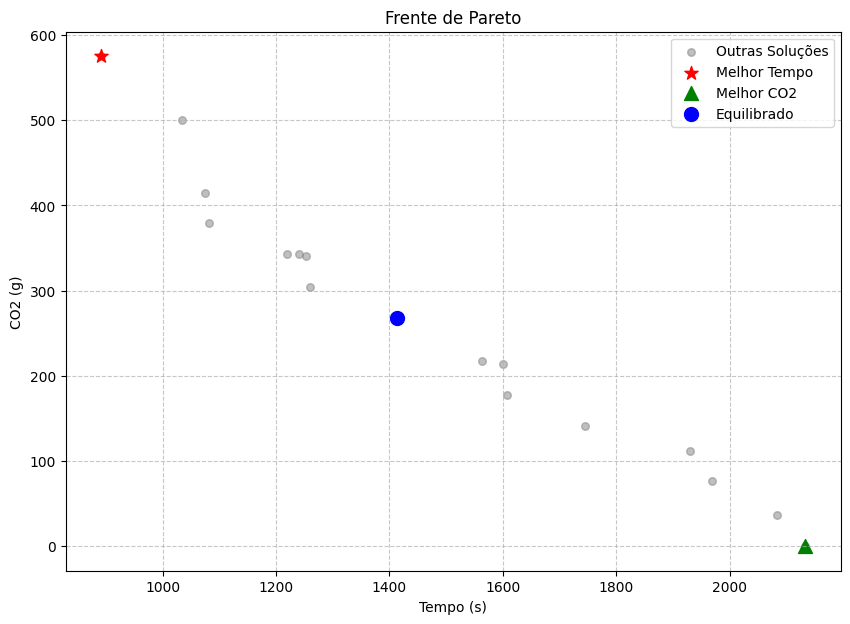

--------------------------------------------------
1. Melhor Tempo: 891s | CO2: 575.20g
2. Equilibrado : 1413s | CO2: 267.67g
3. Melhor CO2  : 2134s | CO2: 0.00g
--------------------------------------------------
A desenhar rota: MELHOR TEMPO...


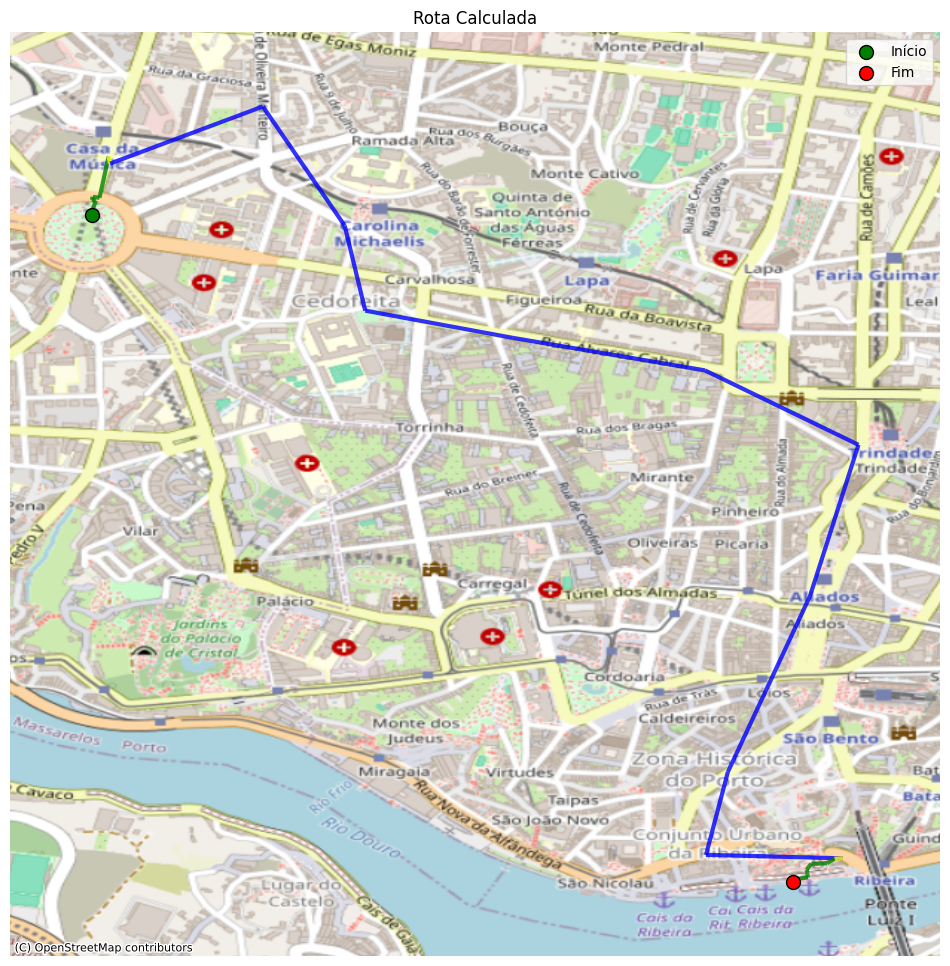

A desenhar rota: EQUILIBRADA...


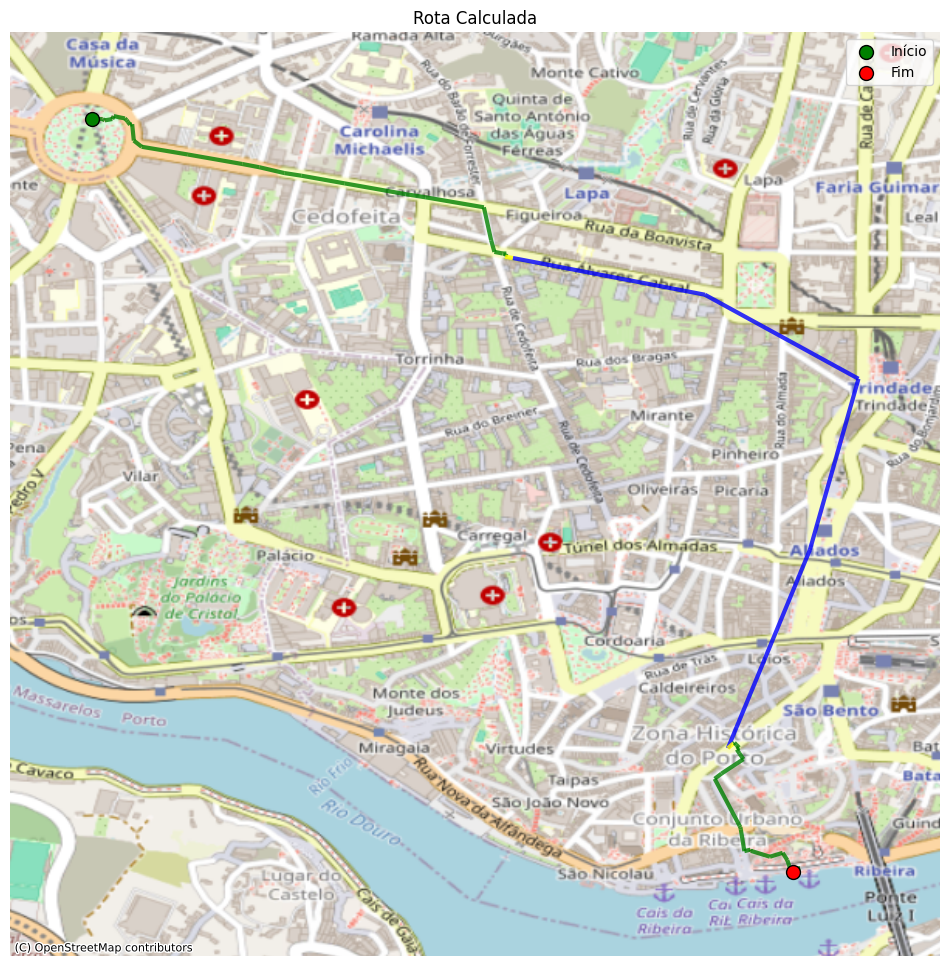

A desenhar rota: MELHOR CO2...


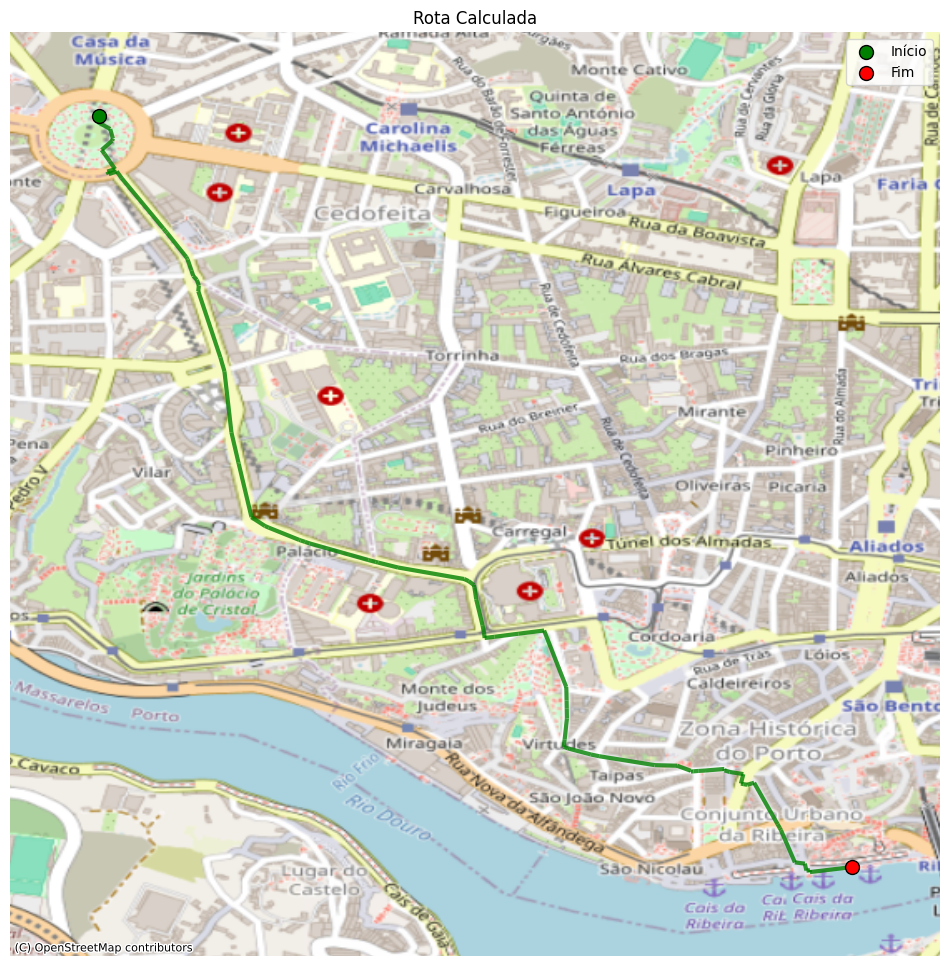

In [60]:
# Funções auxiliares para MOEA/D
def GetCoords(G, n):
    if isinstance(n, tuple) and len(n) == 2 and isinstance(n[0], (int, float)):
        return n
    try:
        node_data = G.nodes[n]
        lat = node_data.get('y', node_data.get('lat'))
        lon = node_data.get('x', node_data.get('lon'))
        if lat is not None and lon is not None:
            return (lat, lon)
    except:
        pass
    return (0.0, 0.0)

def MultiObjectiveHeuristic(coords_curr, coords_dest, w_time, w_co2):
    dist = HaversineDistance(coords_curr[0], coords_curr[1], coords_dest[0], coords_dest[1])
    max_speed = 8.3 
    est_time = dist / max_speed
    est_co2 = dist * 0.1 
    return (w_time * est_time) + (w_co2 * est_co2)

# Inicialização inspirada no MOEA/D com A* (com diferentes pesos)
def InitMOEAD(G, source, target, start_time, pop_size=10):
    print(f"Gerando {pop_size} caminhos iniciais com pesos variados...")
    paths = []
    
    weights = []
    if pop_size > 1:
        for i in range(pop_size):
            alpha = i / (pop_size - 1)
            weights.append((1 - alpha, alpha)) 
    else:
        weights.append((1.0, 0.0))

    target_coords = GetCoords(G, target)

    for w_time, w_co2 in weights:
        pq = []
        heapq.heappush(pq, (0, 0, start_time, source, [source]))
        visited = {}
        path_found = None
        max_iter = 5000 
        iter_count = 0
        
        while pq and iter_count < max_iter:
            iter_count += 1
            _, g, curr_time, u, path = heapq.heappop(pq)
            
            if u == target:
                path_found = path
                break
            
            if u in visited and visited[u] < g:
                continue
            visited[u] = g
            
            for v in G.neighbors(u):
                edge_data = G.get_edge_data(u, v)
                if edge_data:
                    d = edge_data[0] if 0 in edge_data else list(edge_data.values())[0]
                    length = d.get('length', 100)
                    mode = d.get('mode', 'walk')
                    
                    speed = 1.4
                    co2_factor = 0.0
                    if mode == 'bus': speed = 8.3; co2_factor = 0.1
                    elif mode == 'transit': speed = 10.0; co2_factor = 0.05
                    
                    edge_time = length / speed
                    edge_co2 = length * co2_factor
                    
                    if mode in ['bus', 'transit']:
                        edge_time += 300 
                    
                    step_cost = (w_time * edge_time) + (w_co2 * edge_co2)
                    new_g = g + step_cost
                    
                    new_time = curr_time + timedelta(seconds=float(edge_time))
                    
                    v_coords = GetCoords(G, v)
                    h = MultiObjectiveHeuristic(v_coords, target_coords, w_time, w_co2)
                    
                    if v not in visited or new_g < visited[v]:
                         heapq.heappush(pq, (new_g + h, new_g, new_time, v, path + [v]))
        
        if path_found:
            paths.append(path_found)
        else:
            try:
                paths.append(nx.shortest_path(G, source, target))
            except:
                pass

    unique_paths = []
    seen = set()
    for p in paths:
        t_p = tuple(p)
        if t_p not in seen:
            unique_paths.append(p)
            seen.add(t_p)
            
    print(f"Inicialização concluída. {len(unique_paths)} caminhos únicos gerados.")
    return unique_paths

# Definição do problema
class RoutingProblem(ElementwiseProblem):
    def __init__(self, G, start_node, end_node, **kwargs):
        super().__init__(n_var=1, n_obj=2, n_ieq_constr=0, **kwargs)
        self.G = G
        self.start_node = start_node
        self.end_node = end_node

    def _evaluate(self, x, out, *args, **kwargs):
        path = x[0]
        PENALTY = 1e6 
        
        if path is None or len(path) == 0:
            out["F"] = [PENALTY, PENALTY]
            return

        if path[0] != self.start_node or path[-1] != self.end_node:
            out["F"] = [PENALTY, PENALTY]
            return

        try:
            stats = EvaluatePath(self.G, path)
            out["F"] = [float(stats['time']), float(stats['co2'])]
        except:
            out["F"] = [PENALTY, PENALTY]

# Sampling
class GraphSampling(Sampling):
    def __init__(self, G, start_node, end_node, start_time):
        super().__init__()
        self.G = G
        self.start_node = start_node
        self.end_node = end_node
        self.start_time = start_time

    def _do(self, problem, n_samples, **kwargs):
        initial_paths = InitMOEAD(
            self.G, self.start_node, self.end_node, self.start_time, pop_size=n_samples
        )
        
        if not initial_paths:
             try:
                initial_paths = [nx.shortest_path(self.G, self.start_node, self.end_node)]
             except:
                initial_paths = [[]] 
        
        while len(initial_paths) < n_samples:
            initial_paths.append(initial_paths[0]) 
            
        initial_paths = initial_paths[:n_samples]
        
        X = np.empty((n_samples, 1), dtype=object)
        for i in range(n_samples):
            X[i, 0] = initial_paths[i]
        
        return X

class PathCrossover(Crossover):
    def __init__(self, prob=0.9):
        super().__init__(2, 2, prob=prob)

    def _do(self, problem, X, **kwargs):
        _, n_matings, _ = X.shape
        Y = np.empty_like(X)
        for i in range(n_matings):
            p_a, p_b = X[0, i, 0], X[1, i, 0]
            if p_a is None or p_b is None:
                Y[0, i, 0], Y[1, i, 0] = p_a, p_b
                continue
            
            try:
                # Cruzamento simples em nó comum
                commons = list(set(p_a[1:-1]) & set(p_b[1:-1]))
                if commons:
                    cut = np.random.choice(commons)
                    idx_a, idx_b = p_a.index(cut), p_b.index(cut)
                    Y[0, i, 0] = p_a[:idx_a] + p_b[idx_b:]
                    Y[1, i, 0] = p_b[:idx_b] + p_a[idx_a:]
                else:
                    Y[0, i, 0], Y[1, i, 0] = p_a, p_b
            except:
                Y[0, i, 0], Y[1, i, 0] = p_a, p_b
        return Y
    
class PathMutation(Mutation):
    def __init__(self, G, prob=0.2):
        super().__init__(prob=1.0) 
        self.G = G
        self.real_prob = prob 

    def _do(self, problem, X, **kwargs):
        # X é uma matriz (n_indivíduos x 1) de objetos
        for i in range(len(X)):
            # AQUI aplicamos a probabilidade real
            if np.random.random() < self.real_prob:
                path = X[i, 0]
                
                # Proteção contra caminhos inválidos ou muito curtos
                if path is None or len(path) < 5:
                    continue
                
                try:
                    # Seleciona dois índices aleatórios no caminho
                    idxs = sorted(np.random.choice(range(len(path)), 2, replace=False))
                    u, v = path[idxs[0]], path[idxs[1]]
                    
                    subpath = nx.shortest_path(self.G, u, v, weight='length')
                    # Se encontrou e faz sentido, aplica
                    if len(subpath) > 0:
                        # Reconstrói: Inicio + Novo Trecho + Fim
                        new_path = path[:idxs[0]] + subpath + path[idxs[1]+1:]
                        X[i, 0] = new_path
                except:
                    pass 
        return X


# Configuração e execução do NSGA-III
# Definir data/hora e nós de origem/destino
start_datetime = datetime(2025, 4, 23, 8, 30, 0)
# Exemplo de seleção de nós (mantendo a sua lógica de sample ou fixos)
START_COORDS = (41.1584, -8.6291) 
END_COORDS   = (41.1404, -8.6118)
#source_node = stops_bus.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]
#target_node = stops_transit.sample(1).apply(lambda row: (row['stop_lat'], row['stop_lon']), axis=1).values[0]
source_node = NearestGraphNode(G_Multi, START_COORDS)
target_node = NearestGraphNode(G_Multi, END_COORDS)

ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=100)

# Instanciar Operadores (Certifique-se que G_Multi e as classes Sampling/Crossover/Mutation estão definidas anteriormente)
sampling = GraphSampling(G_Multi, source_node, target_node, start_datetime)
crossover = PathCrossover(prob=0.8)
mutation = PathMutation(G_Multi, prob=0.3)

algorithm = NSGA3(
    pop_size=len(ref_dirs), # Tamanho da população igual ao número de direções (15)
    ref_dirs=ref_dirs,
    sampling=sampling,
    crossover=crossover,
    mutation=mutation,
    eliminate_duplicates=False 
)

problem = RoutingProblem(G_Multi, source_node, target_node)

print(f"Executando NSGA-III com {len(ref_dirs)} indivíduos por 50 gerações...")

# 2. MAIS ITERAÇÕES
res = minimize(problem,
               algorithm,
               termination=('n_gen', 50), # Aumentado para 50 gerações
               seed=1,
               verbose=True)

print(f"Terminado. Soluções encontradas: {len(res.F)}")

# --- ANÁLISE E PLOTAGEM DOS 3 OBJETIVOS ---
F = res.F # Objetivos: [Tempo, CO2]
X = res.X # Soluções: [Caminhos]

# Função auxiliar para extrair o caminho independentemente do formato retornado por pymoo
def _extract_path(x):
    # x pode ser: lista de nós, ndarray de objeto com shape (1,), ou escalar
    if isinstance(x, np.ndarray):
        if x.ndim == 0:
            x = x.item()
        elif x.ndim == 1 and x.size == 1:
            x = x[0]
    # Se for escalar inteiro, embrulhar em lista para evitar erros de indexação
    if isinstance(x, (int, np.integer)):
        x = [int(x)]
    return x

# Identificar os índices das 3 soluções de interesse
# 1. Melhor Tempo (Mínimo da coluna 0)
idx_time = int(np.argmin(F[:, 0]))

# 2. Melhor CO2 (Mínimo da coluna 1)
idx_co2 = int(np.argmin(F[:, 1]))

# 3. Equilibrado (Mediana ordenada pelo tempo)
# Ordenamos os índices baseados no tempo e pegamos o do meio
sorted_indices = np.argsort(F[:, 0])
idx_balanced = int(sorted_indices[len(sorted_indices) // 2])

# Plotar a Frente de Pareto destacando os 3 pontos
plt.figure(figsize=(10, 7))
plt.scatter(F[:, 0], F[:, 1], c='gray', s=30, alpha=0.5, label='Outras Soluções')
plt.scatter(F[idx_time, 0], F[idx_time, 1], c='red', s=100, marker='*', label='Melhor Tempo')
plt.scatter(F[idx_co2, 0], F[idx_co2, 1], c='green', s=100, marker='^', label='Melhor CO2')
plt.scatter(F[idx_balanced, 0], F[idx_balanced, 1], c='blue', s=100, marker='o', label='Equilibrado')

plt.title("Frente de Pareto")
plt.xlabel("Tempo (s)")
plt.ylabel("CO2 (g)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Imprimir detalhes
print("-" * 50)
print(f"1. Melhor Tempo: {F[idx_time, 0]:.0f}s | CO2: {F[idx_time, 1]:.2f}g")
print(f"2. Equilibrado : {F[idx_balanced, 0]:.0f}s | CO2: {F[idx_balanced, 1]:.2f}g")
print(f"3. Melhor CO2  : {F[idx_co2, 0]:.0f}s | CO2: {F[idx_co2, 1]:.2f}g")
print("-" * 50)

# Plotar os 3 caminhos no grafo
# Usa a função PlotPath já existente no seu notebook

print("A desenhar rota: MELHOR TEMPO...")
PlotPath(G_Multi, _extract_path(X[idx_time]))

print("A desenhar rota: EQUILIBRADA...")
PlotPath(G_Multi, _extract_path(X[idx_balanced]))

print("A desenhar rota: MELHOR CO2...")
PlotPath(G_Multi, _extract_path(X[idx_co2]))

### **Random Walk**

#### Facil

Executando NSGA-III com 101 indivíduos por 50 gerações...
Gerando 101 caminhos iniciais com pesos variados...
Inicialização concluída. 2 caminhos únicos gerados.
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      101 |      1 |             - |             -
     2 |      202 |      1 |  0.000000E+00 |             f
     3 |      303 |      1 |  0.000000E+00 |             f
     4 |      404 |      1 |  0.000000E+00 |             f
     5 |      505 |      1 |  0.000000E+00 |             f
     6 |      606 |      1 |  0.000000E+00 |             f
     7 |      707 |      1 |  0.000000E+00 |             f
     8 |      808 |      1 |  0.000000E+00 |             f
     9 |      909 |      1 |  0.000000E+00 |             f
    10 |     1010 |      1 |  0.000000E+00 |             f
    11 |     1111 |      1 |  0.000000E+00 |             f
    12 |     1212 |      1 |  0.000000E+00 |             f
    13 |     1313 |      1 |  0.000000E+00 |             f
    14 |    

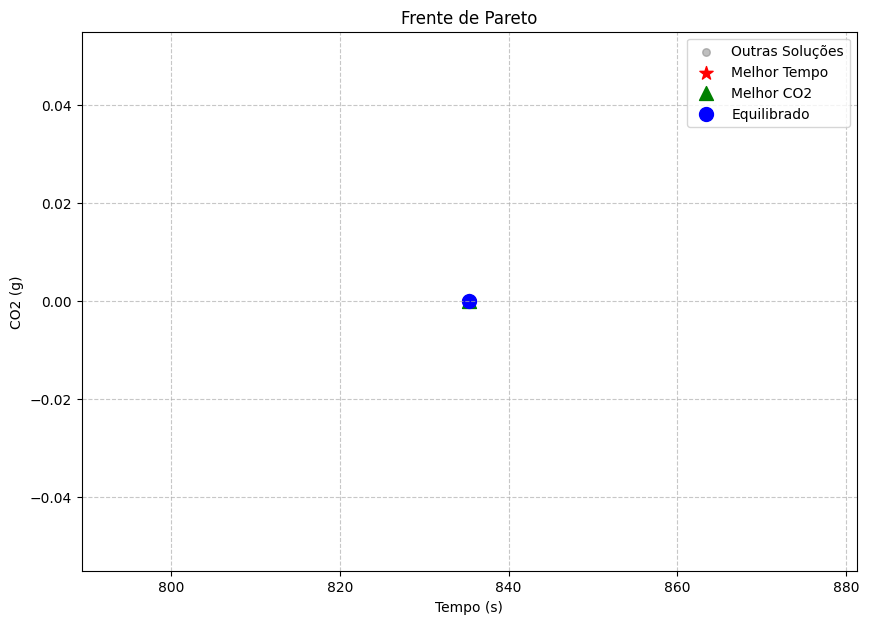

--------------------------------------------------
1. Melhor Tempo: 835s | CO2: 0.00g
2. Equilibrado : 835s | CO2: 0.00g
3. Melhor CO2  : 835s | CO2: 0.00g
--------------------------------------------------
A desenhar rota: MELHOR TEMPO...


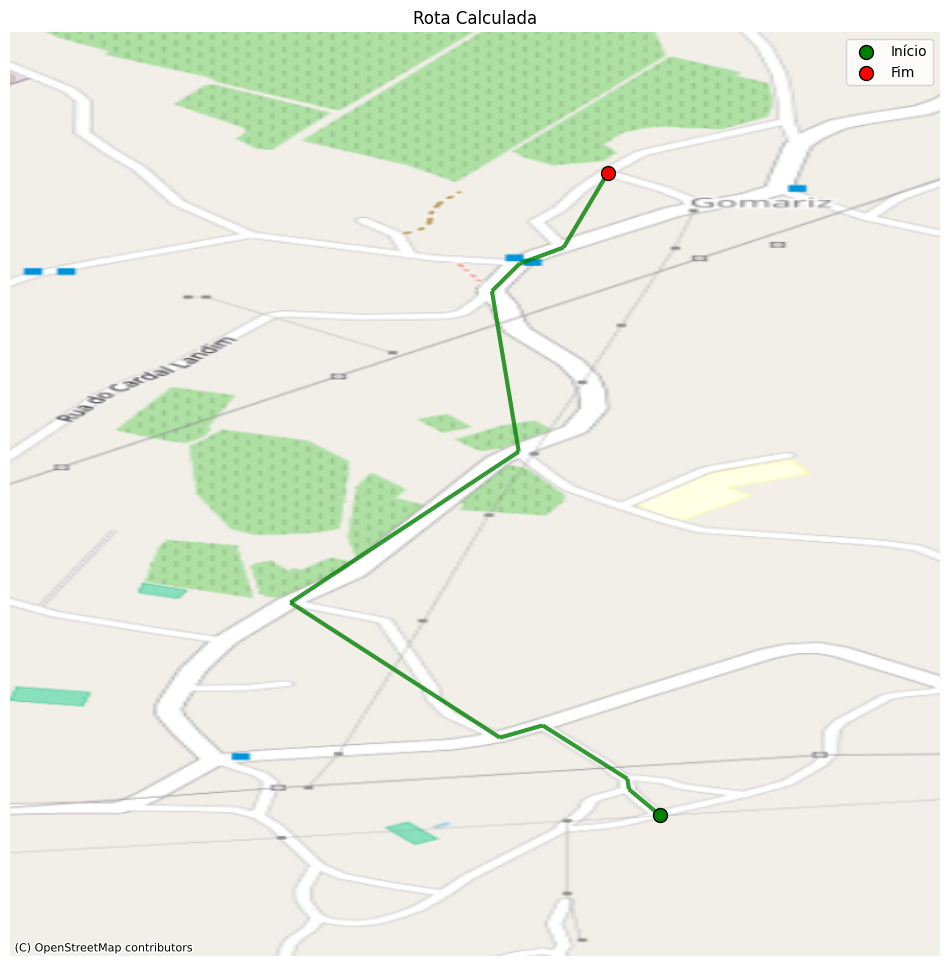

A desenhar rota: EQUILIBRADA...


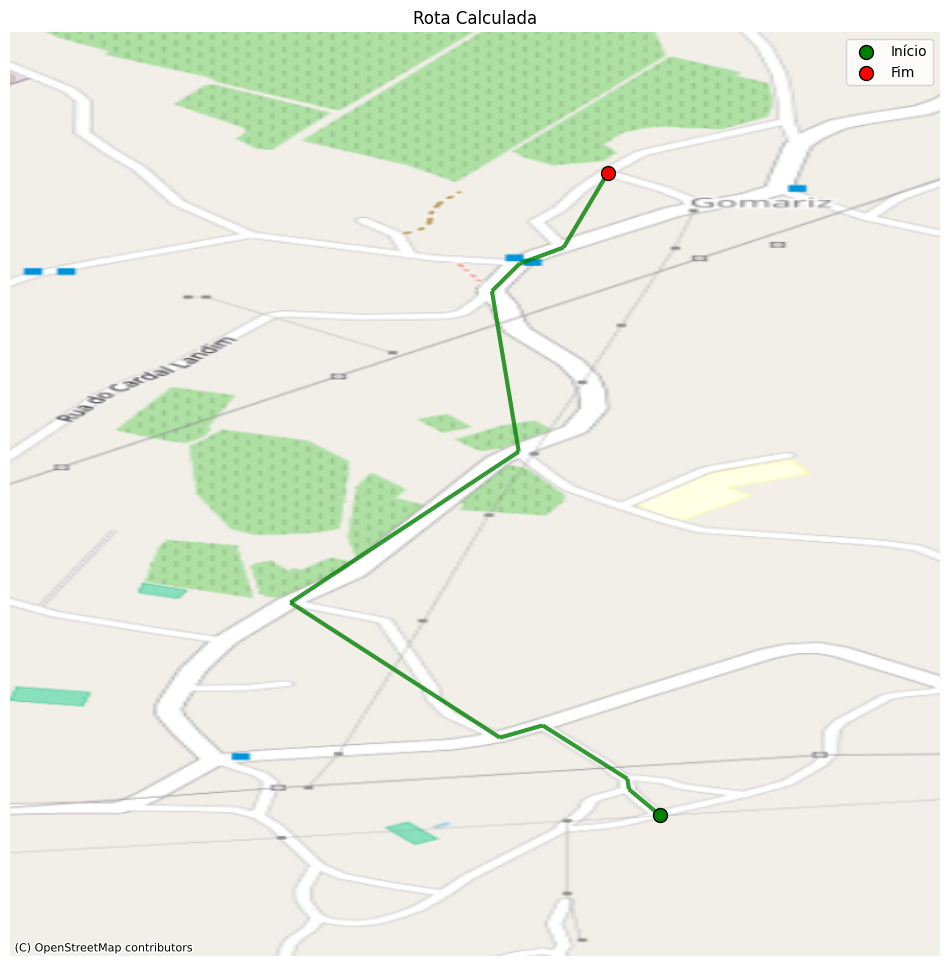

A desenhar rota: MELHOR CO2...


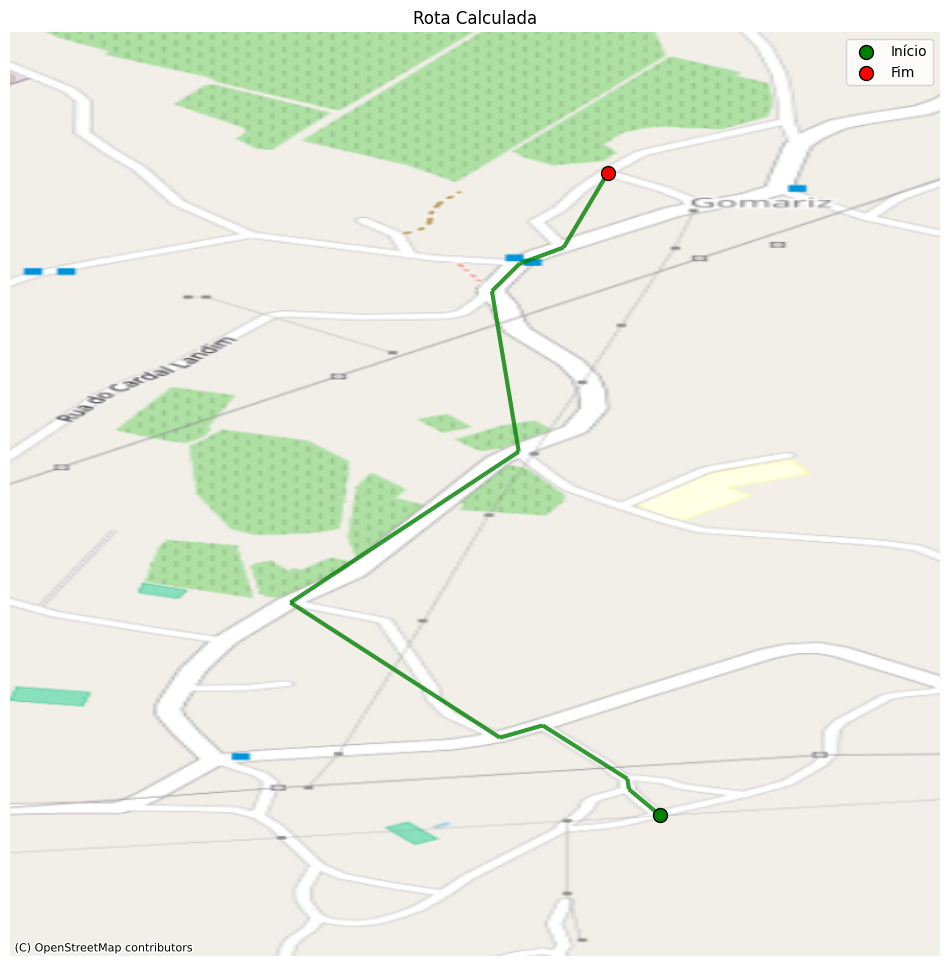

In [61]:
start, end = CreateRandomScenario(G_Multi, difficulty='low', max_attempts=10000, seed=42)

ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=100)

# Instanciar Operadores (Certifique-se que G_Multi e as classes Sampling/Crossover/Mutation estão definidas anteriormente)
sampling = GraphSampling(G_Multi, start, end, start_datetime)
crossover = PathCrossover(prob=0.8)
mutation = PathMutation(G_Multi, prob=0.3)

algorithm = NSGA3(
    pop_size=len(ref_dirs), # Tamanho da população igual ao número de direções (15)
    ref_dirs=ref_dirs,
    sampling=sampling,
    crossover=crossover,
    mutation=mutation,
    eliminate_duplicates=False 
)

problem = RoutingProblem(G_Multi, start, end)

print(f"Executando NSGA-III com {len(ref_dirs)} indivíduos por 50 gerações...")

# 2. MAIS ITERAÇÕES
res = minimize(problem,
               algorithm,
               termination=('n_gen', 50), # Aumentado para 50 gerações
               seed=1,
               verbose=True)

print(f"Terminado. Soluções encontradas: {len(res.F)}")

# --- ANÁLISE E PLOTAGEM DOS 3 OBJETIVOS ---
F = res.F # Objetivos: [Tempo, CO2]
X = res.X # Soluções: [Caminhos]

# Função auxiliar para extrair o caminho independentemente do formato retornado por pymoo
def _extract_path(x):
    # x pode ser: lista de nós, ndarray de objeto com shape (1,), ou escalar
    if isinstance(x, np.ndarray):
        if x.ndim == 0:
            x = x.item()
        elif x.ndim == 1 and x.size == 1:
            x = x[0]
        elif x.ndim == 2 and x.shape[0] == 1:
            x = x[0, 0]
    # Se x for lista, retornar direto
    if isinstance(x, list):
        return x
    # Se for escalar inteiro, significa que houve um erro na extração
    # Retornar lista vazia como fallback
    if isinstance(x, (int, np.integer)):
        return []
    return x if isinstance(x, list) else []

# Identificar os índices das 3 soluções de interesse
# 1. Melhor Tempo (Mínimo da coluna 0)
idx_time = int(np.argmin(F[:, 0]))

# 2. Melhor CO2 (Mínimo da coluna 1)
idx_co2 = int(np.argmin(F[:, 1]))

# 3. Equilibrado (Mediana ordenada pelo tempo)
# Ordenamos os índices baseados no tempo e pegamos o do meio
sorted_indices = np.argsort(F[:, 0])
idx_balanced = int(sorted_indices[len(sorted_indices) // 2])

# Plotar a Frente de Pareto destacando os 3 pontos
plt.figure(figsize=(10, 7))
plt.scatter(F[:, 0], F[:, 1], c='gray', s=30, alpha=0.5, label='Outras Soluções')
plt.scatter(F[idx_time, 0], F[idx_time, 1], c='red', s=100, marker='*', label='Melhor Tempo')
plt.scatter(F[idx_co2, 0], F[idx_co2, 1], c='green', s=100, marker='^', label='Melhor CO2')
plt.scatter(F[idx_balanced, 0], F[idx_balanced, 1], c='blue', s=100, marker='o', label='Equilibrado')

plt.title("Frente de Pareto")
plt.xlabel("Tempo (s)")
plt.ylabel("CO2 (g)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Imprimir detalhes
print("-" * 50)
print(f"1. Melhor Tempo: {F[idx_time, 0]:.0f}s | CO2: {F[idx_time, 1]:.2f}g")
print(f"2. Equilibrado : {F[idx_balanced, 0]:.0f}s | CO2: {F[idx_balanced, 1]:.2f}g")
print(f"3. Melhor CO2  : {F[idx_co2, 0]:.0f}s | CO2: {F[idx_co2, 1]:.2f}g")
print("-" * 50)

# Plotar os 3 caminhos no grafo
# Usa a função PlotPath já existente no seu notebook

print("A desenhar rota: MELHOR TEMPO...")
PlotPath(G_Multi, _extract_path(X[idx_time]))

print("A desenhar rota: EQUILIBRADA...")
PlotPath(G_Multi, _extract_path(X[idx_balanced]))

print("A desenhar rota: MELHOR CO2...")
PlotPath(G_Multi, _extract_path(X[idx_co2]))

#### Médio

Executando NSGA-III com 101 indivíduos por 50 gerações...
Gerando 101 caminhos iniciais com pesos variados...
Inicialização concluída. 16 caminhos únicos gerados.
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      101 |      3 |             - |             -
     2 |      202 |      5 |  0.0955631266 |             f
     3 |      303 |      4 |  0.0276414883 |         ideal
     4 |      404 |      4 |  0.000000E+00 |             f
     5 |      505 |      4 |  0.000000E+00 |             f
     6 |      606 |      6 |  0.0567727702 |             f
     7 |      707 |      6 |  0.000000E+00 |             f
     8 |      808 |      6 |  0.000000E+00 |             f
     9 |      909 |      6 |  0.000000E+00 |             f
    10 |     1010 |      6 |  0.000000E+00 |             f
    11 |     1111 |      6 |  0.000000E+00 |             f
    12 |     1212 |      6 |  0.000000E+00 |             f
    13 |     1313 |      6 |  0.000000E+00 |             f
    14 |   

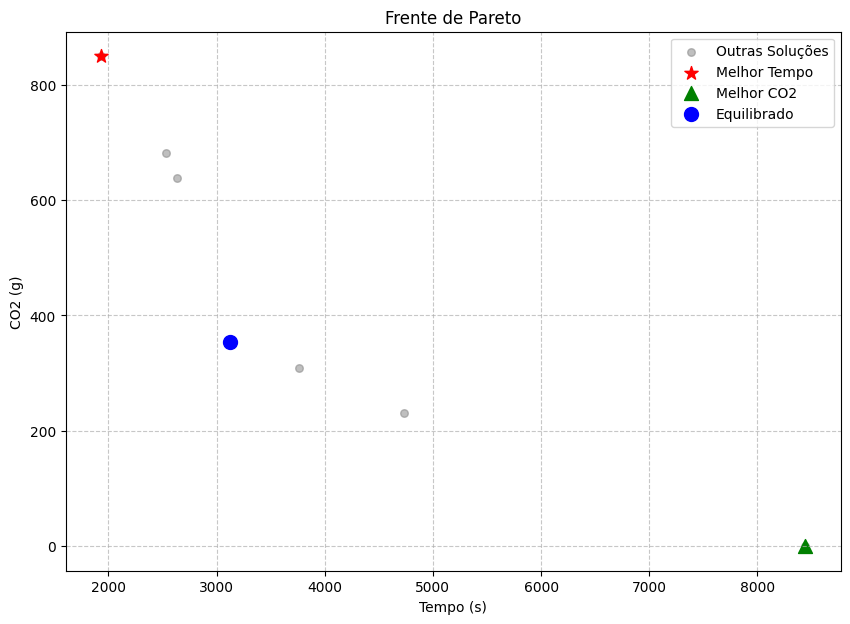

--------------------------------------------------
1. Melhor Tempo: 1931s | CO2: 849.41g
2. Equilibrado : 3125s | CO2: 353.76g
3. Melhor CO2  : 8443s | CO2: 0.00g
--------------------------------------------------
A desenhar rota: MELHOR TEMPO...


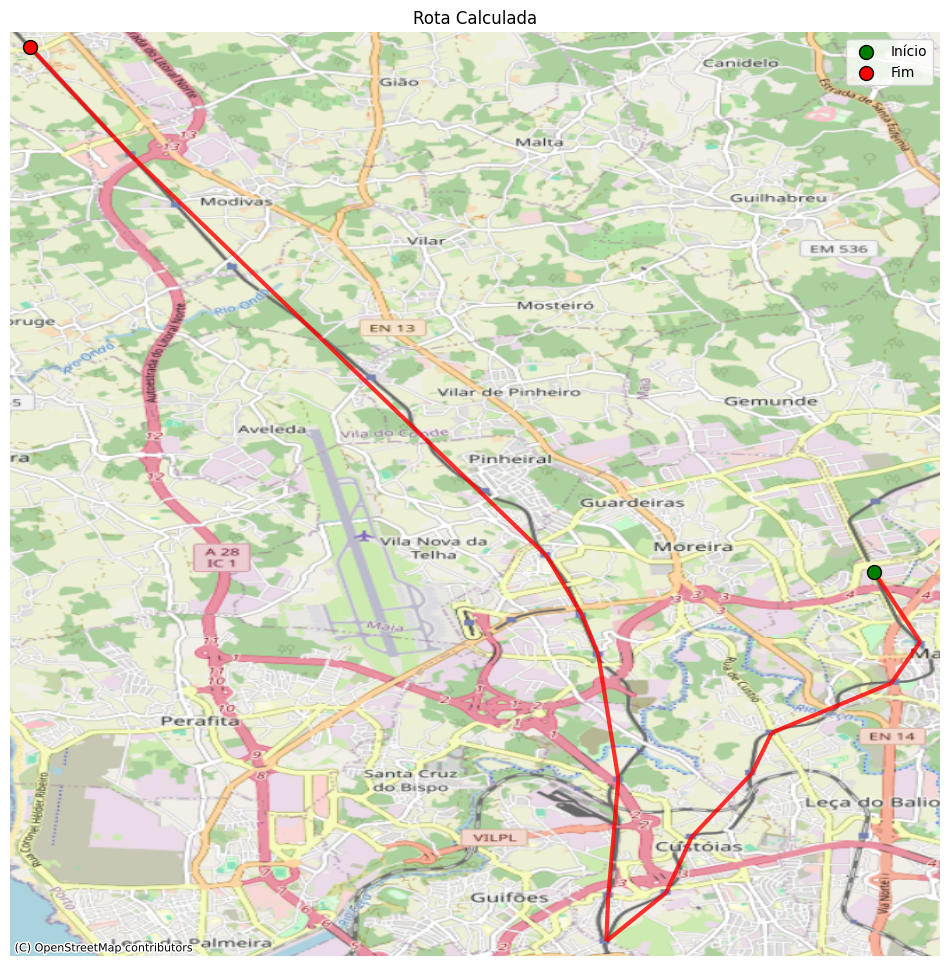

A desenhar rota: EQUILIBRADA...


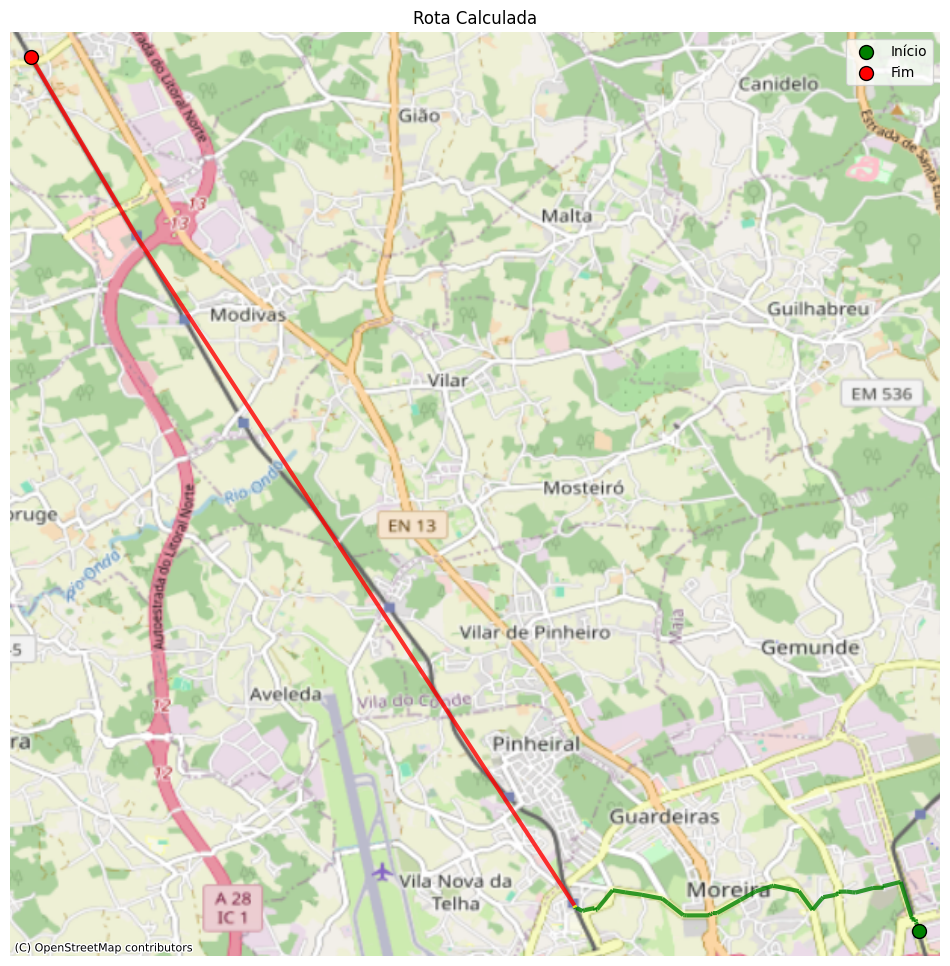

A desenhar rota: MELHOR CO2...


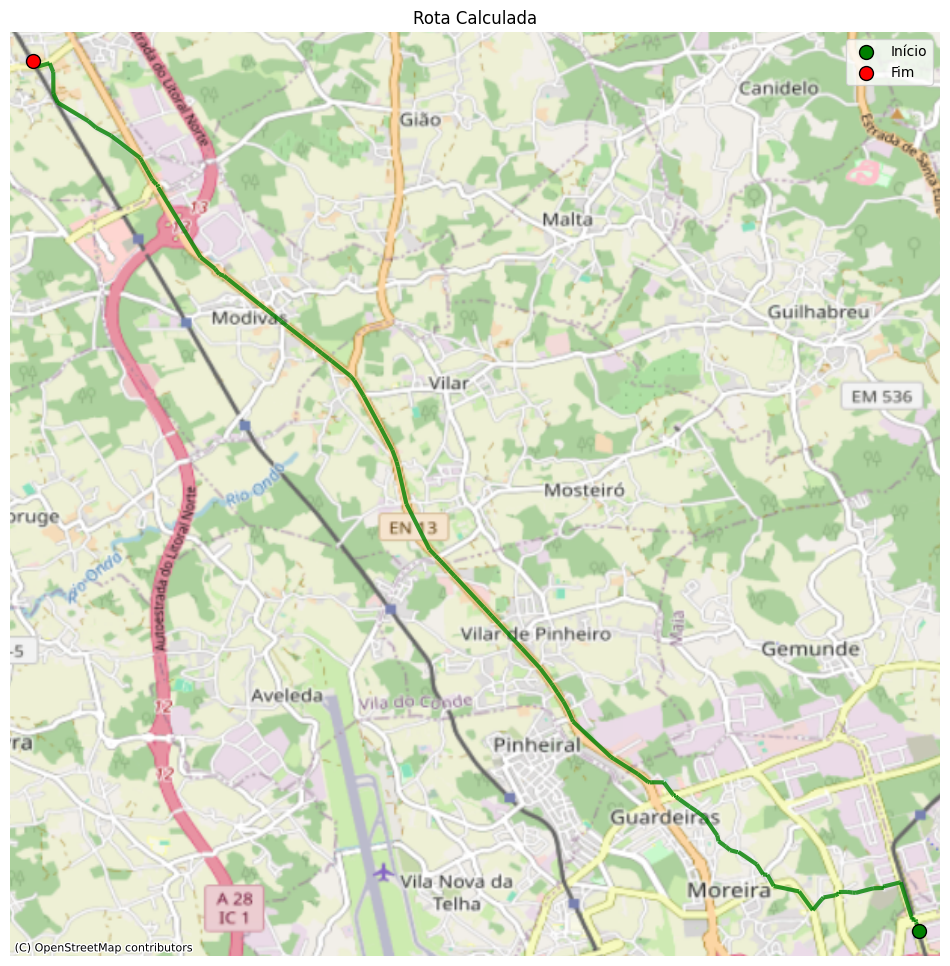

In [62]:
start, end = CreateRandomScenario(G_Multi, difficulty='medium', max_attempts=10000, seed=42)

ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=100)

# Instanciar Operadores (Certifique-se que G_Multi e as classes Sampling/Crossover/Mutation estão definidas anteriormente)
sampling = GraphSampling(G_Multi, start, end, start_datetime)
crossover = PathCrossover(prob=0.8)
mutation = PathMutation(G_Multi, prob=0.3)

algorithm = NSGA3(
    pop_size=len(ref_dirs), # Tamanho da população igual ao número de direções (15)
    ref_dirs=ref_dirs,
    sampling=sampling,
    crossover=crossover,
    mutation=mutation,
    eliminate_duplicates=False 
)

problem = RoutingProblem(G_Multi, start, end)

print(f"Executando NSGA-III com {len(ref_dirs)} indivíduos por 50 gerações...")

# 2. MAIS ITERAÇÕES
res = minimize(problem,
               algorithm,
               termination=('n_gen', 50), # Aumentado para 50 gerações
               seed=1,
               verbose=True)

print(f"Terminado. Soluções encontradas: {len(res.F)}")

# --- ANÁLISE E PLOTAGEM DOS 3 OBJETIVOS ---
F = res.F # Objetivos: [Tempo, CO2]
X = res.X # Soluções: [Caminhos]

# Função auxiliar para extrair o caminho independentemente do formato retornado por pymoo
def _extract_path(x):
    # x pode ser: lista de nós, ndarray de objeto com shape (1,), ou escalar
    if isinstance(x, np.ndarray):
        if x.ndim == 0:
            x = x.item()
        elif x.ndim == 1 and x.size == 1:
            x = x[0]
    # Se for escalar inteiro, embrulhar em lista para evitar erros de indexação
    if isinstance(x, (int, np.integer)):
        x = [int(x)]
    return x

# Identificar os índices das 3 soluções de interesse
# 1. Melhor Tempo (Mínimo da coluna 0)
idx_time = int(np.argmin(F[:, 0]))

# 2. Melhor CO2 (Mínimo da coluna 1)
idx_co2 = int(np.argmin(F[:, 1]))

# 3. Equilibrado (Mediana ordenada pelo tempo)
# Ordenamos os índices baseados no tempo e pegamos o do meio
sorted_indices = np.argsort(F[:, 0])
idx_balanced = int(sorted_indices[len(sorted_indices) // 2])

# Plotar a Frente de Pareto destacando os 3 pontos
plt.figure(figsize=(10, 7))
plt.scatter(F[:, 0], F[:, 1], c='gray', s=30, alpha=0.5, label='Outras Soluções')
plt.scatter(F[idx_time, 0], F[idx_time, 1], c='red', s=100, marker='*', label='Melhor Tempo')
plt.scatter(F[idx_co2, 0], F[idx_co2, 1], c='green', s=100, marker='^', label='Melhor CO2')
plt.scatter(F[idx_balanced, 0], F[idx_balanced, 1], c='blue', s=100, marker='o', label='Equilibrado')

plt.title("Frente de Pareto")
plt.xlabel("Tempo (s)")
plt.ylabel("CO2 (g)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Imprimir detalhes
print("-" * 50)
print(f"1. Melhor Tempo: {F[idx_time, 0]:.0f}s | CO2: {F[idx_time, 1]:.2f}g")
print(f"2. Equilibrado : {F[idx_balanced, 0]:.0f}s | CO2: {F[idx_balanced, 1]:.2f}g")
print(f"3. Melhor CO2  : {F[idx_co2, 0]:.0f}s | CO2: {F[idx_co2, 1]:.2f}g")
print("-" * 50)

# Plotar os 3 caminhos no grafo
# Usa a função PlotPath já existente no seu notebook

print("A desenhar rota: MELHOR TEMPO...")
PlotPath(G_Multi, _extract_path(X[idx_time]))

print("A desenhar rota: EQUILIBRADA...")
PlotPath(G_Multi, _extract_path(X[idx_balanced]))

print("A desenhar rota: MELHOR CO2...")
PlotPath(G_Multi, _extract_path(X[idx_co2]))

#### Dificil

Executando NSGA-III com 101 indivíduos por 50 gerações...
Gerando 101 caminhos iniciais com pesos variados...
Inicialização concluída. 10 caminhos únicos gerados.
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      101 |      5 |             - |             -
     2 |      202 |      5 |  0.000000E+00 |             f
     3 |      303 |      5 |  0.0146288859 |         nadir
     4 |      404 |      5 |  0.000000E+00 |             f
     5 |      505 |      5 |  0.0311524432 |         nadir
     6 |      606 |      5 |  0.000000E+00 |             f
     7 |      707 |      5 |  0.000000E+00 |             f
     8 |      808 |      5 |  0.000000E+00 |             f
     9 |      909 |      6 |  0.0148636232 |         nadir
    10 |     1010 |      6 |  0.000000E+00 |             f
    11 |     1111 |      8 |  0.0108950695 |             f
    12 |     1212 |     10 |  0.0291356931 |             f
    13 |     1313 |     11 |  0.0055600637 |             f
    14 |   

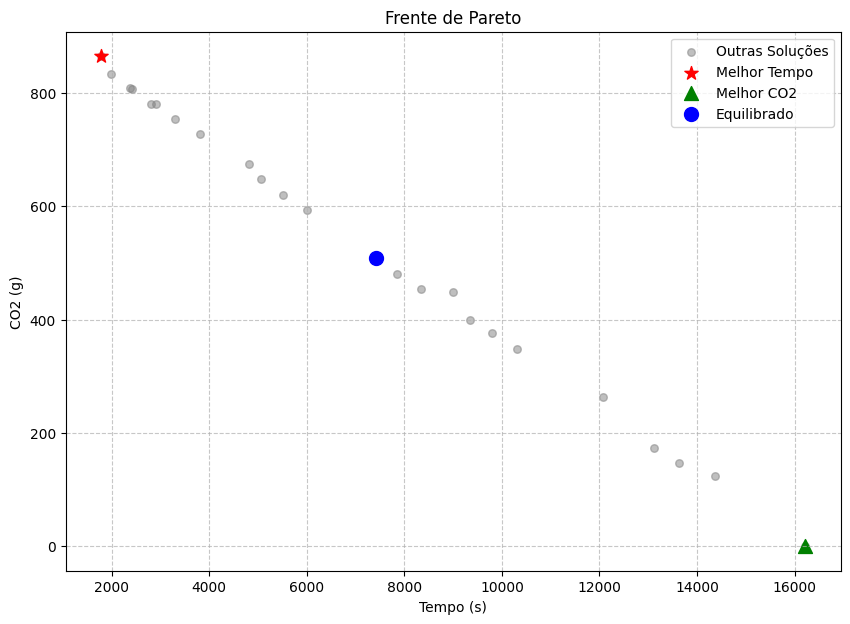

--------------------------------------------------
1. Melhor Tempo: 1780s | CO2: 864.69g
2. Equilibrado : 7412s | CO2: 508.41g
3. Melhor CO2  : 16221s | CO2: 0.00g
--------------------------------------------------
A desenhar rota: MELHOR TEMPO...


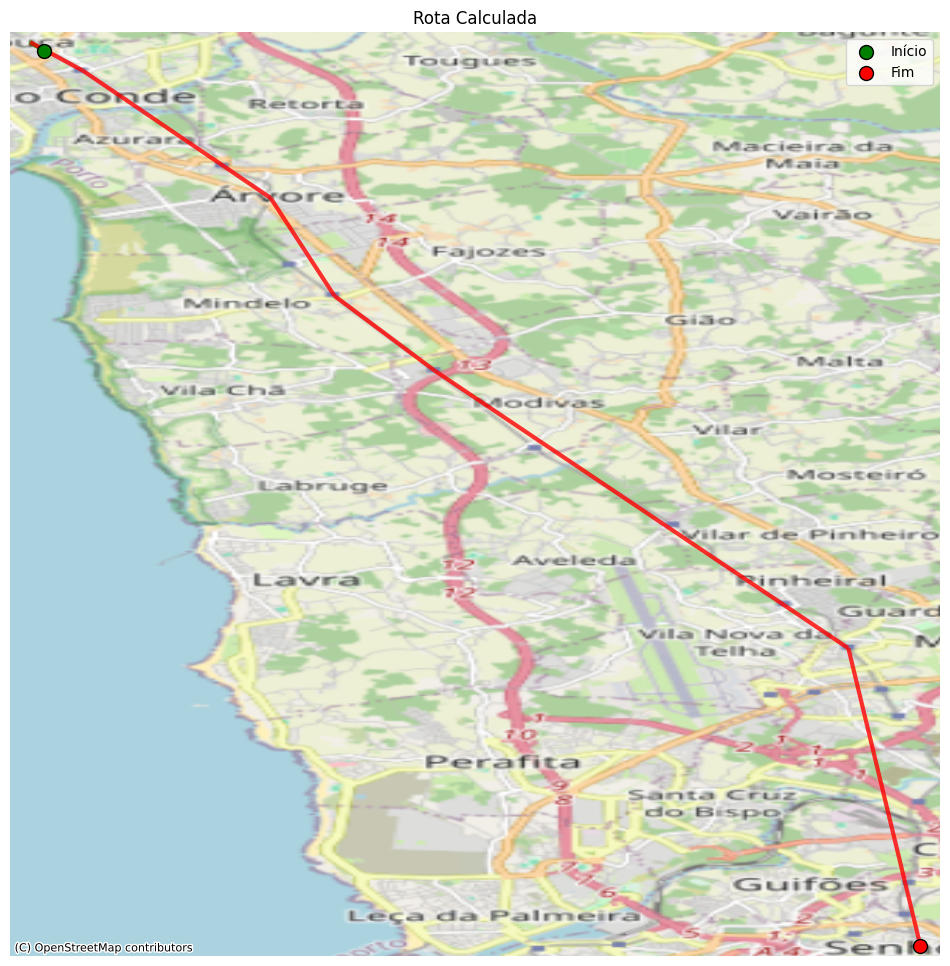

A desenhar rota: EQUILIBRADA...


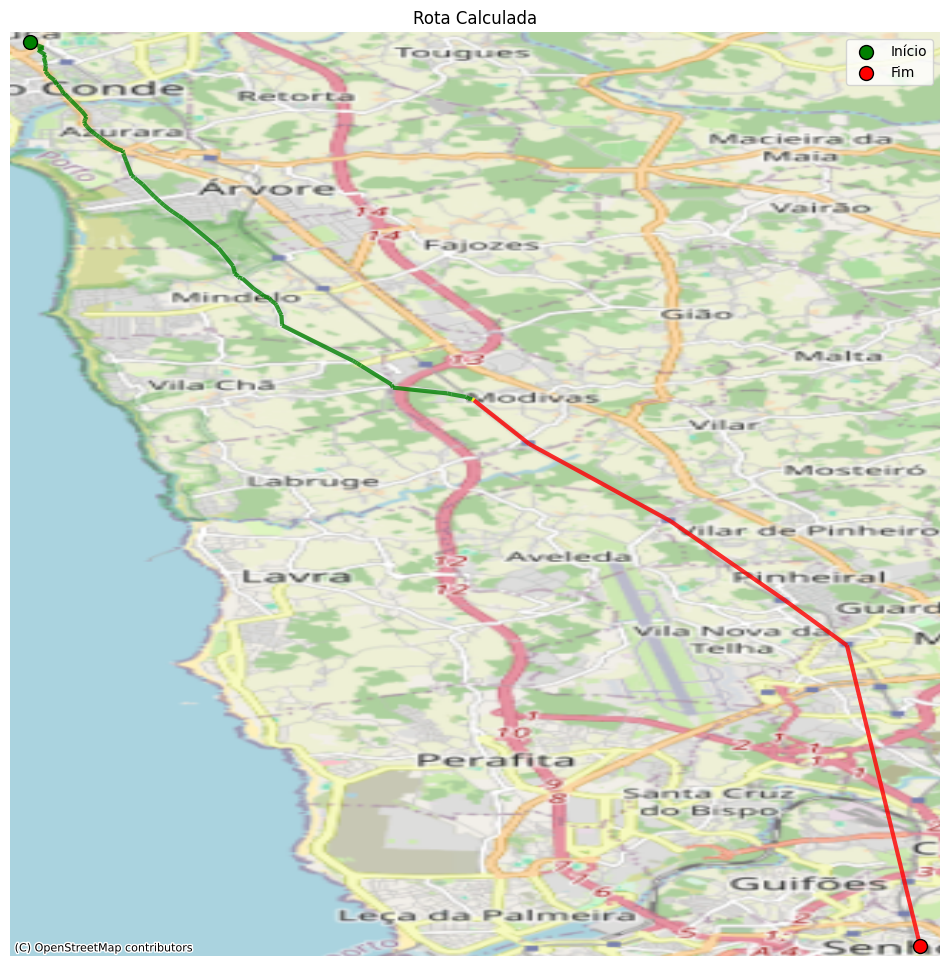

A desenhar rota: MELHOR CO2...


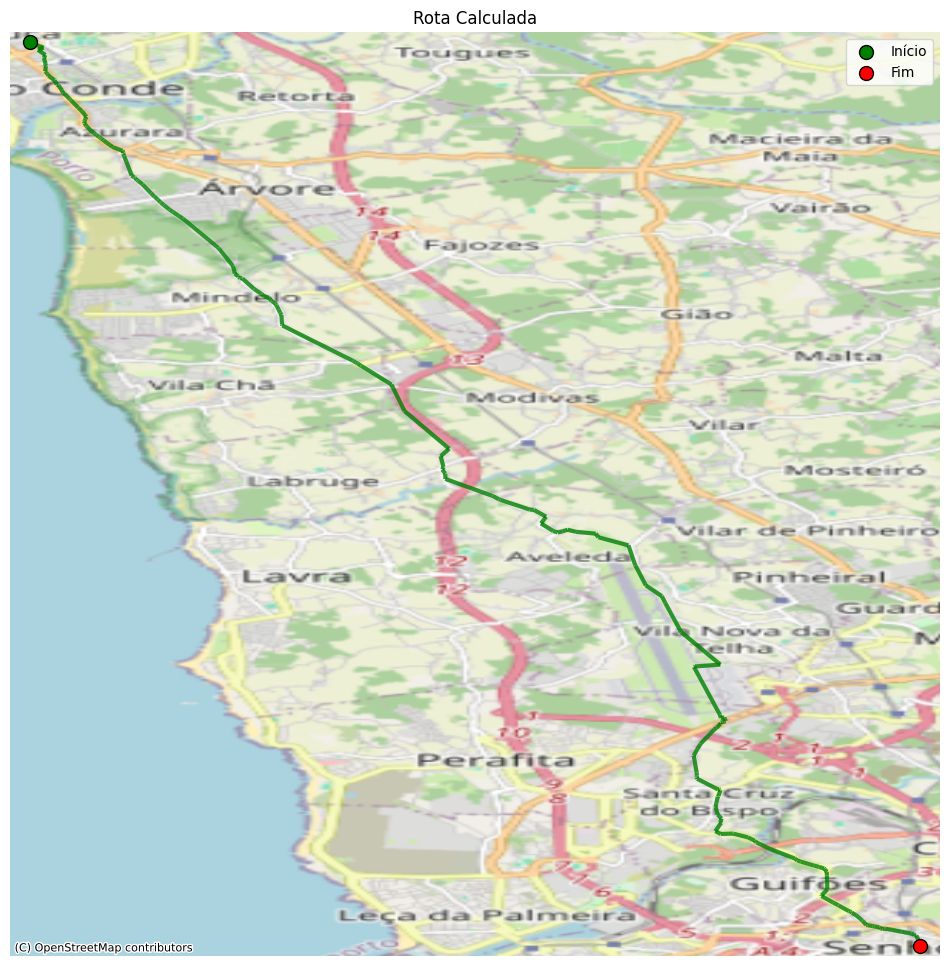

In [63]:
start, end = CreateRandomScenario(G_Multi, difficulty='high',max_attempts=1000000, seed=41)

ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=100)

# Instanciar Operadores (Certifique-se que G_Multi e as classes Sampling/Crossover/Mutation estão definidas anteriormente)
sampling = GraphSampling(G_Multi, start, end, start_datetime)
crossover = PathCrossover(prob=0.8)
mutation = PathMutation(G_Multi, prob=0.3)

algorithm = NSGA3(
    pop_size=len(ref_dirs),
    ref_dirs=ref_dirs,
    sampling=sampling,
    crossover=crossover,
    mutation=mutation,
    eliminate_duplicates=False 
)

problem = RoutingProblem(G_Multi, start, end)

print(f"Executando NSGA-III com {len(ref_dirs)} indivíduos por 50 gerações...")

# 2. MAIS ITERAÇÕES
res = minimize(problem,
               algorithm,
               termination=('n_gen', 50), # Aumentado para 50 gerações
               seed=1,
               verbose=True)

print(f"Terminado. Soluções encontradas: {len(res.F)}")

# --- ANÁLISE E PLOTAGEM DOS 3 OBJETIVOS ---
F = res.F # Objetivos: [Tempo, CO2]
X = res.X # Soluções: [Caminhos]

# Função auxiliar para extrair o caminho independentemente do formato retornado por pymoo
def _extract_path(x):
    # x pode ser: lista de nós, ndarray de objeto com shape (1,), ou escalar
    if isinstance(x, np.ndarray):
        if x.ndim == 0:
            x = x.item()
        elif x.ndim == 1 and x.size == 1:
            x = x[0]
    # Se for escalar inteiro, embrulhar em lista para evitar erros de indexação
    if isinstance(x, (int, np.integer)):
        x = [int(x)]
    return x

# Identificar os índices das 3 soluções de interesse
# 1. Melhor Tempo (Mínimo da coluna 0)
idx_time = int(np.argmin(F[:, 0]))

# 2. Melhor CO2 (Mínimo da coluna 1)
idx_co2 = int(np.argmin(F[:, 1]))

# 3. Equilibrado (Mediana ordenada pelo tempo)
# Ordenamos os índices baseados no tempo e pegamos o do meio
sorted_indices = np.argsort(F[:, 0])
idx_balanced = int(sorted_indices[len(sorted_indices) // 2])

# Plotar a Frente de Pareto destacando os 3 pontos
plt.figure(figsize=(10, 7))
plt.scatter(F[:, 0], F[:, 1], c='gray', s=30, alpha=0.5, label='Outras Soluções')
plt.scatter(F[idx_time, 0], F[idx_time, 1], c='red', s=100, marker='*', label='Melhor Tempo')
plt.scatter(F[idx_co2, 0], F[idx_co2, 1], c='green', s=100, marker='^', label='Melhor CO2')
plt.scatter(F[idx_balanced, 0], F[idx_balanced, 1], c='blue', s=100, marker='o', label='Equilibrado')

plt.title("Frente de Pareto")
plt.xlabel("Tempo (s)")
plt.ylabel("CO2 (g)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Imprimir detalhes
print("-" * 50)
print(f"1. Melhor Tempo: {F[idx_time, 0]:.0f}s | CO2: {F[idx_time, 1]:.2f}g")
print(f"2. Equilibrado : {F[idx_balanced, 0]:.0f}s | CO2: {F[idx_balanced, 1]:.2f}g")
print(f"3. Melhor CO2  : {F[idx_co2, 0]:.0f}s | CO2: {F[idx_co2, 1]:.2f}g")
print("-" * 50)

# Plotar os 3 caminhos no grafo
# Usa a função PlotPath já existente no seu notebook

print("A desenhar rota: MELHOR TEMPO...")
PlotPath(G_Multi, _extract_path(X[idx_time]))

print("A desenhar rota: EQUILIBRADA...")
PlotPath(G_Multi, _extract_path(X[idx_balanced]))

print("A desenhar rota: MELHOR CO2...")
PlotPath(G_Multi, _extract_path(X[idx_co2]))